## PART 2.1: GLOBAL COVID CASES ANALYSIS

# Table of contents
1. Data Gathering<br>
    1.1 Datasets from github<br>
    1.2 Data shape<br>

2. Data Cleaning<br>
    2.1 Date values<br>
    2.2 Missing values<br>
    2.3 Incorrect data<br>

3. Data Pre-processing and Aggregation<br>
    3.1 merging dataframes<br>
    3.2 Calculating additional data<br>
    
4. Data Visualization<br>
    4.1 Major impacted contried bubble graph<br>
    4.2 Total cases coutry-wise<br>
    4.3 Total Deaths country-wise<br>
    4.4 Country comparison / percetage cases<br>
    4.5 India / US / Others<br>

5. Data Modelling & Forecasting / Predictions<br>
    5.1 SVM
    5.1.1 Support Vector Machine Modelling<br>
    5.1.2 SVM Predictions graph<br>
    5.2 Polynomial Regression<br>
    5.2.1 Polynomial Regression Modelling<br>
    5.2.2 Polynomial Regression predictions graph<br>
    5.3 Baysian Ridge Regression<br>
    5.3.1 Bayesian Ridge Regression Modelling<br>
    5.3.2 Bayesian Ridge Regression graph<br>
    5.4 Observations<br>

7. Model Comparision<br>
    7.1 Comparison dataframe<br>
    7.2 Observations<br>


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
import plotly.express as px
import matplotlib.dates as mdates
import datetime
import pandas as pd
import altair as alt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

import warnings
warnings.filterwarnings("ignore")
import plotly
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [2]:
import matplotlib.colors as mcolors
import random
import math
import time
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import operator 
plt.style.use('fivethirtyeight')
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import warnings
warnings.filterwarnings("ignore")

### 1. Data Gathering

### 1.1 Dataset from github
1. The data is available at CSSEGISandData github repository in form of .csv files
2. The data is seperated into different files, we need to combine that data

In [4]:
confirmedDF = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deathsDF = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recoveredDF = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
latestData = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/05-10-2021.csv')

In [5]:
confirmedDF.shape

(275, 484)

### 1.2 Data Shape
1. Shape is interesting because there are more that 480 colums
2. The date wise observations are on the column side

In [6]:
confirmedDF.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,4/6/21,4/7/21,4/8/21,4/9/21,4/10/21,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21,4/19/21,4/20/21,4/21/21,4/22/21,4/23/21,4/24/21,4/25/21,4/26/21,4/27/21,4/28/21,4/29/21,4/30/21,5/1/21,5/2/21,5/3/21,5/4/21,5/5/21,5/6/21,5/7/21,5/8/21,5/9/21,5/10/21,5/11/21,5/12/21,5/13/21,5/14/21,5/15/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,56779,56873,56943,57019,57144,57160,57242,57364,57492,57534,57612,57721,57793,57898,58037,58214,58312,58542,58730,58843,59015,59225,59370,59576,59745,59939,60122,60300,60563,60797,61162,61455,61755,61842,62063,62403,62718,63045,63355,63412
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,126936,127192,127509,127795,128155,128393,128518,128752,128959,129128,129307,129456,129594,129694,129842,129980,130114,130270,130409,130537,130606,130736,130859,130977,131085,131185,131238,131276,131327,131419,131510,131577,131666,131723,131753,131803,131845,131890,131939,131978
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,117879,118004,118116,118251,118378,118516,118645,118799,118975,119142,119323,119486,119642,119805,119992,120174,120363,120562,120736,120922,121112,121344,121580,121866,122108,122311,122522,122717,122999,123272,123473,123692,123900,124104,124288,124483,124682,124889,125059,125194
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,12328,12363,12409,12456,12497,12545,12581,12614,12641,12641,12712,12771,12805,12805,12874,12917,12942,13007,13024,13060,13083,13121,13148,13198,13232,13232,13282,13295,13316,13340,13363,13390,13406,13423,13429,13447,13470,13470,13510,13510
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,22885,23010,23108,23242,23331,23457,23549,23697,23841,23951,24122,24300,24389,24518,24661,24883,25051,25279,25492,25609,25710,25942,26168,26431,26652,26815,26993,27133,27284,27529,27921,28201,28477,28740,28875,29146,29405,29695,30030,30354


### 2. Data Cleaning

### 2.1 Handling Date values for time series analysis

## Loading the dataset and Extracting the date list
1. Starting from column 4 we have the date columns which can be used to extract the datewise cases information
2. There are also other .csv files for deaths and recovers, merging them all

In [7]:
confirmedDF.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '5/6/21', '5/7/21', '5/8/21', '5/9/21', '5/10/21', '5/11/21', '5/12/21',
       '5/13/21', '5/14/21', '5/15/21'],
      dtype='object', length=484)

In [8]:
confirmedDF.columns[4:]

Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '5/6/21', '5/7/21', '5/8/21', '5/9/21', '5/10/21', '5/11/21', '5/12/21',
       '5/13/21', '5/14/21', '5/15/21'],
      dtype='object', length=480)

In [9]:
cols = confirmedDF.keys()
confirmed = confirmedDF.loc[:, cols[4]:cols[-1]]
deaths = deathsDF.loc[:, cols[4]:cols[-1]]

dates = confirmed.keys()

In [10]:
dates = confirmed.keys()
globalCases = []
globalDeaths = [] 
mortalRate = []

for i in dates:
    confirmed_sum = confirmed[i].sum()
    death_sum = deaths[i].sum()
    
    globalCases.append(confirmed_sum)
    globalDeaths.append(death_sum)
    
    mortalRate.append(death_sum/confirmed_sum)

In [11]:
daysFromBeginning = np.array([i for i in range(len(dates))]).reshape(-1, 1)
globalCases = np.array(globalCases).reshape(-1, 1)
globalDeaths = np.array(globalDeaths).reshape(-1, 1)

In [12]:
daysInFuture = 25
future_forcast = np.array([i for i in range(len(dates)+daysInFuture)]).reshape(-1, 1)
adjusted_dates = future_forcast[:-10]

### Converting dates for better visualization
1. Converting the dates to standerd datetime format

In [13]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
forcastDatesFuture = []
for i in range(len(future_forcast)):
    forcastDatesFuture.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

### Train Test Split for Modelling
1. skipping the first 50 days data for data correctness purpose
2. Using the 97:3 split for training and testing

In [14]:
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(daysFromBeginning[50:], globalCases[50:], test_size=0.03, shuffle=False) 
X_train_deaths, X_test_deaths, y_train_deaths, y_test_deaths = train_test_split(daysFromBeginning[50:], globalDeaths[50:], test_size=0.03, shuffle=False) 

### 3. Data Preprocessing

###  Merging the confirmedDF, deathsDF and recoveredDF

In [15]:
date_values = confirmedDF.columns[4:]

confirmedDFLong = confirmedDF.melt(
    id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
    value_vars=date_values, 
    var_name='Date', 
    value_name='Confirmed'
)
deathsDFLong = deathsDF.melt(
    id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
    value_vars=date_values, 
    var_name='Date', 
    value_name='Deaths'
)
recoveredDFLong = recoveredDF.melt(
    id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
    value_vars=date_values, 
    var_name='Date', 
    value_name='Recovered'
)

### Converting to new long DataFrames. 
1. All of them are ordered by Date and Country/Region because raw data was already ordered by Country/Region.
2. the date columns are already in ASC order.

In [16]:
confirmedDFLong.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed
0,NaN,Afghanistan,33.93911,67.709953,1/22/20,0
1,NaN,Albania,41.15330,20.168300,1/22/20,0
2,NaN,Algeria,28.03390,1.659600,1/22/20,0
3,NaN,Andorra,42.50630,1.521800,1/22/20,0
4,NaN,Angola,-11.20270,17.873900,1/22/20,0


### Incorrect data: Canada recovered data 
1. the data is counted by Country-wise rather than Province/State-wise
2. so we need to drop that data [dropping it]

In [17]:
canada_recoverd_data = recoveredDFLong[recoveredDFLong['Country/Region']=='Canada']

In [18]:
canada_recoverd_data.head()

,Province/State,Country/Region,Lat,Long,Date,Recovered
39,NaN,Canada,56.1304,-106.3468,1/22/20,0
299,NaN,Canada,56.1304,-106.3468,1/23/20,0
559,NaN,Canada,56.1304,-106.3468,1/24/20,0
819,NaN,Canada,56.1304,-106.3468,1/25/20,0
1079,NaN,Canada,56.1304,-106.3468,1/26/20,0


In [19]:
recoveredDFLong = recoveredDFLong[recoveredDFLong['Country/Region']!='Canada']

### Merging the 3 dataframes
1. 3 dataframes are merged and fullTable frame is generated

In [20]:
# Merging confirmedDFLong and deathsDFLong
fullTable = confirmedDFLong.merge(
  right=deathsDFLong, 
  how='left',
  on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long']
)
# Merging fullTable and recoveredDFLong
fullTable = fullTable.merge(
  right=recoveredDFLong, 
  how='left',
  on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long']
)

In [21]:
fullTable.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.93911,67.709953,1/22/20,0,0,0.0
1,NaN,Albania,41.15330,20.168300,1/22/20,0,0,0.0
2,NaN,Algeria,28.03390,1.659600,1/22/20,0,0,0.0
3,NaN,Andorra,42.50630,1.521800,1/22/20,0,0,0.0
4,NaN,Angola,-11.20270,17.873900,1/22/20,0,0,0.0


### Data PreProcessing and Aggregation

### Data Cleaning

#### Handling the date values

In [22]:
fullTable['Date'] = pd.to_datetime(fullTable['Date'])

In [23]:
fullTable.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0.0
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0.0
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0.0
3,NaN,Andorra,42.50630,1.521800,2020-01-22,0,0,0.0
4,NaN,Angola,-11.20270,17.873900,2020-01-22,0,0,0.0


### Detecting the missing values

In [24]:
fullTable.isna().sum()

Province/State    90720
Country/Region        0
Lat                 960
Long                960
Date                  0
Confirmed             0
Deaths                0
Recovered         10080
dtype: int64

### Observations
1. The province/state data is mostly missing
2. significant recovered data is also missing
3. filling in the recovered data with default valeus

In [25]:
fullTable['Recovered'] = fullTable['Recovered'].fillna(0)

### Ship data needs to be filtered out
1. The data also countains the ship data
2. the covid cases reported earlier were counted as ship cases
3. For global trend analysis filtering them into seperate ships dataframe

In [26]:
# cruise ships: Grand Princess, Diamond Princess and MS Zaandam
fullTable[fullTable['Country/Region'] == 'Diamond Princess']

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
105,NaN,Diamond Princess,0.0,0.0,2020-01-22,0,0,0.0
380,NaN,Diamond Princess,0.0,0.0,2020-01-23,0,0,0.0
655,NaN,Diamond Princess,0.0,0.0,2020-01-24,0,0,0.0
930,NaN,Diamond Princess,0.0,0.0,2020-01-25,0,0,0.0
1205,NaN,Diamond Princess,0.0,0.0,2020-01-26,0,0,0.0
...,...,...,...,...,...,...,...,...
130730,NaN,Diamond Princess,0.0,0.0,2021-05-11,712,13,699.0
131005,NaN,Diamond Princess,0.0,0.0,2021-05-12,712,13,699.0
131280,NaN,Diamond Princess,0.0,0.0,2021-05-13,712,13,699.0
131555,NaN,Diamond Princess,0.0,0.0,2021-05-14,712,13,699.0


#### Extracting the ship data and deleting from original data

In [27]:
ship_rows = fullTable['Province/State'].str.contains('Grand Princess') | fullTable['Province/State'].str.contains('Diamond Princess') | fullTable['Country/Region'].str.contains('Diamond Princess') | fullTable['Country/Region'].str.contains('MS Zaandam')
full_ship = fullTable[ship_rows]

In [28]:
fullTable = fullTable[~(ship_rows)]

### Data aggregation 
1. Calculating the Active cases column
2. formula is confirmed - deaths - recovered

In [29]:
# Active Case = confirmed - deaths - recovered
fullTable['Active'] = fullTable['Confirmed'] - fullTable['Deaths'] - fullTable['Recovered']

In [30]:
fullTable

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0.0,0.0
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0.0,0.0
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0.0,0.0
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0.0,0.0
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
131995,NaN,Vietnam,14.058324,108.277199,2021-05-15,4112,36,2668.0,1408.0
131996,NaN,West Bank and Gaza,31.952200,35.233200,2021-05-15,303658,3423,291191.0,9044.0
131997,NaN,Yemen,15.552727,48.516388,2021-05-15,6538,1285,3014.0,2239.0
131998,NaN,Zambia,-13.133897,27.849332,2021-05-15,92409,1260,90777.0,372.0


####  Aggregating data into Country/Region
1. grouping the data country/region wise.
2. Collecting only cases columns

In [31]:
fullGrouped = fullTable.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()

In [32]:
fullGrouped

,Date,Country/Region,Confirmed,Deaths,Recovered,Active
0,2020-01-22,Afghanistan,0,0,0.0,0.0
1,2020-01-22,Albania,0,0,0.0,0.0
2,2020-01-22,Algeria,0,0,0.0,0.0
3,2020-01-22,Andorra,0,0,0.0,0.0
4,2020-01-22,Angola,0,0,0.0,0.0
...,...,...,...,...,...,...
91195,2021-05-15,Vietnam,4112,36,2668.0,1408.0
91196,2021-05-15,West Bank and Gaza,303658,3423,291191.0,9044.0
91197,2021-05-15,Yemen,6538,1285,3014.0,2239.0
91198,2021-05-15,Zambia,92409,1260,90777.0,372.0


#### add day wise New cases, New deaths and New recovered by deducting the corresponding accumulative data on the previous day.

In [33]:
# new cases 
temp = fullGrouped.groupby(['Country/Region', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()
mask = temp['Country/Region'] != temp['Country/Region'].shift(1)
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan
# renaming columns
temp.columns = ['Country/Region', 'Date', 'New cases', 'New deaths', 'New recovered']
# merging new values
fullGrouped = pd.merge(fullGrouped, temp, on=['Country/Region', 'Date'])
# filling na with 0
fullGrouped = fullGrouped.fillna(0)
# fixing data types
cols = ['New cases', 'New deaths', 'New recovered']
fullGrouped[cols] = fullGrouped[cols].astype('int')
fullGrouped['New cases'] = fullGrouped['New cases'].apply(lambda x: 0 if x<0 else x)

In [34]:
fullGrouped

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
0,2020-01-22,Afghanistan,0,0,0.0,0.0,0,0,0
1,2020-01-22,Albania,0,0,0.0,0.0,0,0,0
2,2020-01-22,Algeria,0,0,0.0,0.0,0,0,0
3,2020-01-22,Andorra,0,0,0.0,0.0,0,0,0
4,2020-01-22,Angola,0,0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...
91195,2021-05-15,Vietnam,4112,36,2668.0,1408.0,296,1,11
91196,2021-05-15,West Bank and Gaza,303658,3423,291191.0,9044.0,388,22,2300
91197,2021-05-15,Yemen,6538,1285,3014.0,2239.0,15,0,6
91198,2021-05-15,Zambia,92409,1260,90777.0,372.0,53,0,78


In [35]:
fullGrouped.to_csv('COVID-19-time-series-clean-complete.csv')

### 4 Data Visualization

### Country wise corona virus spread

In [36]:
import pandas as pd
import altair as alt
fullGrouped = pd.read_csv('COVID-19-time-series-clean-complete.csv', parse_dates=['Date'])

In [37]:
fullGrouped = pd.read_csv('COVID-19-time-series-clean-complete.csv', parse_dates=['Date'])
countries = ['US', 'Italy', 'China', 'Spain', 'Germany', 'France', 'India', 'United Kingdom', 'Switzerland']
selectedCountries = fullGrouped[fullGrouped['Country/Region'].isin(countries)]

In [38]:
selectedCountries

,Unnamed: 0,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
36,36,2020-01-22,China,548,17,28.0,503.0,0,0,0
61,61,2020-01-22,France,0,0,0.0,0.0,0,0,0
65,65,2020-01-22,Germany,0,0,0.0,0.0,0,0,0
78,78,2020-01-22,India,0,0,0.0,0.0,0,0,0
84,84,2020-01-22,Italy,0,0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
91094,91094,2021-05-15,Italy,4153374,124063,3696481.0,332830.0,6652,136,13292
91170,91170,2021-05-15,Spain,3604799,79339,150376.0,3375084.0,0,0,0
91175,91175,2021-05-15,Switzerland,679510,10730,317600.0,351180.0,0,0,0
91186,91186,2021-05-15,US,32923982,585708,0.0,32338274.0,28813,476,0


In [39]:
alt.Chart(selectedCountries).mark_circle().encode(
    x='yearmonthdate(Date):O',
    y='Country/Region',
    color='Country/Region',
    size=alt.Size('New cases:Q',
        scale=alt.Scale(range=[0, 1000]),
        legend=alt.Legend(title='Daily new cases')
    ) 
).properties(
    width=800,
    height=300
)

alt.Chart(...)

### Observations
1. The cases trend in above countries is time series visualizaiotn
2. on x axis we have the dates
3. on y axis we have the country/regions
4. As can be seen from the graph India is worst affected

In [40]:
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import pandas as pd 
import random
import math
import time
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import datetime
import operator 
plt.style.use('fivethirtyeight')
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import warnings
warnings.filterwarnings("ignore")

In [41]:
def getCountryInfo(country_name):
    countryCases = []
    country_deaths = []
    
    for i in date_values:
        countryCases.append(confirmedDF[confirmedDF['Country/Region']==country_name][i].sum())
        country_deaths.append(deathsDF[deathsDF['Country/Region']==country_name][i].sum())
    return (countryCases, country_deaths)

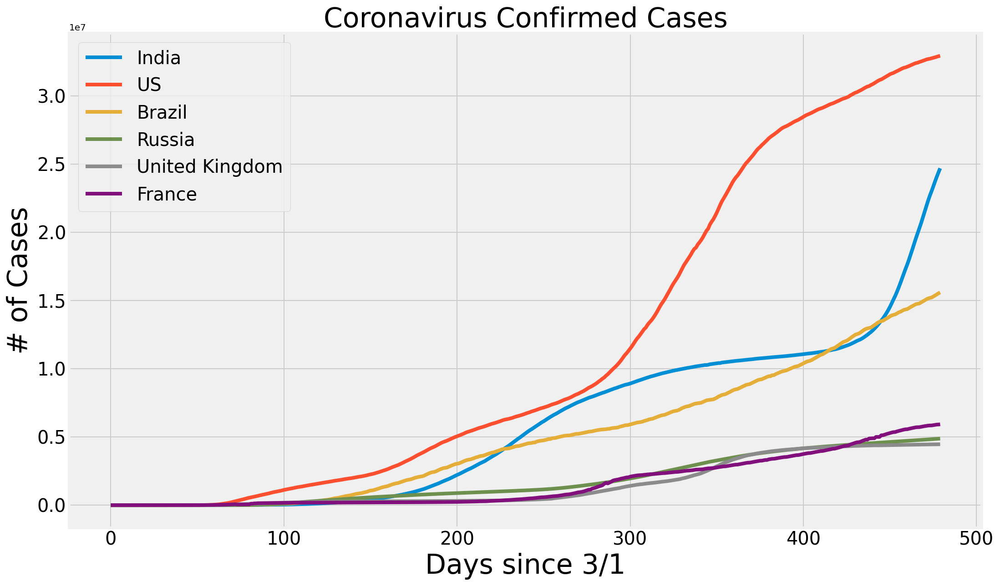

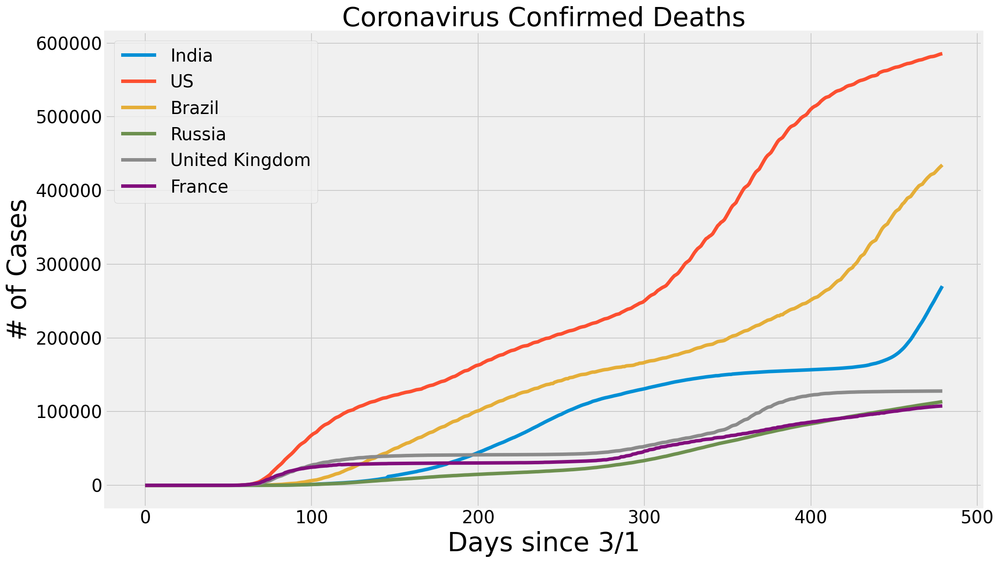

In [42]:
compare_countries = ['India', 'US', 'Brazil', 'Russia', 'United Kingdom', 'France'] 
graph_name = ['Coronavirus Confirmed Cases', 'Coronavirus Confirmed Deaths']

for num in range(2):
    plt.figure(figsize=(16, 10))
    for country in compare_countries:
        plt.plot(getCountryInfo(country)[num])
    plt.legend(compare_countries, prop={'size': 20})
    plt.xlabel('Days since 3/1', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.title(graph_name[num], size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

### Observations
1. Trends can be seen from the visualization graphs for Total cases and Total deaths
2. India, Brazil have the recent outbreaks
3. US trend seems to be flattening like other countries
4. India Shows the sudden rize in the number of deaths and new cases

In [43]:
latestData

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2021-05-11 04:20:41,33.939110,67.709953,62063,2698,54382.0,4983.0,Afghanistan,159.428834,4.347196
1,NaN,NaN,NaN,Albania,2021-05-11 04:20:41,41.153300,20.168300,131753,2416,118041.0,11296.0,Albania,4578.254222,1.833734
2,NaN,NaN,NaN,Algeria,2021-05-11 04:20:41,28.033900,1.659600,124288,3335,86554.0,34399.0,Algeria,283.432255,2.683284
3,NaN,NaN,NaN,Andorra,2021-05-11 04:20:41,42.506300,1.521800,13429,127,13021.0,281.0,Andorra,17380.443927,0.945714
4,NaN,NaN,NaN,Angola,2021-05-11 04:20:41,-11.202700,17.873900,28875,636,24772.0,3467.0,Angola,87.856035,2.202597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3978,NaN,NaN,NaN,Vietnam,2021-05-11 04:20:41,14.058324,108.277199,3489,35,2618.0,836.0,Vietnam,3.584396,1.003153
3979,NaN,NaN,NaN,West Bank and Gaza,2021-05-11 04:20:41,31.952200,35.233200,302249,3378,287206.0,11665.0,West Bank and Gaza,5924.805975,1.117622
3980,NaN,NaN,NaN,Yemen,2021-05-11 04:20:41,15.552727,48.516388,6485,1275,3001.0,2209.0,Yemen,21.742798,19.660756
3981,NaN,NaN,NaN,Zambia,2021-05-11 04:20:41,-13.133897,27.849332,92112,1257,90501.0,354.0,Zambia,501.045586,1.364643


In [44]:
uniqueCountries =  list(latestData['Country_Region'].unique())

In [45]:
countryConfirmedCases = []
countryDeathCases = [] 
countryActiveCases = []
countryIncidenceRate = [] 
countryMortalRate = [] 

no_cases = []
for i in uniqueCountries:
    cases = latestData[latestData['Country_Region']==i]['Confirmed'].sum()
    if cases > 0:
        countryConfirmedCases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    uniqueCountries.remove(i)
    
# sort countries by the number of confirmed cases
uniqueCountries = [k for k, v in sorted(zip(uniqueCountries, countryConfirmedCases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(uniqueCountries)):
    countryConfirmedCases[i] = latestData[latestData['Country_Region']==uniqueCountries[i]]['Confirmed'].sum()
    countryDeathCases.append(latestData[latestData['Country_Region']==uniqueCountries[i]]['Deaths'].sum())
#     country_recovery_cases.append(latestData[latestData['Country_Region']==uniqueCountries[i]]['Recovered'].sum())
    countryActiveCases.append(latestData[latestData['Country_Region']==uniqueCountries[i]]['Active'].sum())
    countryIncidenceRate.append(latestData[latestData['Country_Region']==uniqueCountries[i]]['Incident_Rate'].sum())
    countryMortalRate.append(countryDeathCases[i]/countryConfirmedCases[i])

#### Country wise analysis of incidence rate and mortality rate

In [46]:
countryDF = pd.DataFrame({'Country Name': uniqueCountries, 'Number of Confirmed Cases': [format(int(i), ',d') for i in countryConfirmedCases],
                          'Number of Deaths': [format(int(i), ',d') for i in countryDeathCases], 
                          'Number of Active Cases' : [format(int(i), ',d') for i in countryActiveCases], 'Incidence Rate' : countryIncidenceRate,
                          'Mortality Rate': countryMortalRate})
# number of cases per country/region

countryDF.style.background_gradient(cmap='Oranges')

,Country Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,US,"32,745,255","582,153",0,31476168.243051,0.017778
1,India,"22,992,517","249,992","3,715,221",84000.303847,0.010873
2,Brazil,"15,209,990","423,229","1,305,699",234458.091437,0.027826
3,France,"5,841,593","106,845","5,362,348",56808.516341,0.018290
4,Turkey,"5,044,936","43,311","257,754",5981.730863,0.008585
5,Russia,"4,832,959","111,740","269,776",277092.658581,0.023120
6,United Kingdom,"4,452,956","127,870","4,309,998",55887.802328,0.028716
7,Italy,"4,116,287","123,031","373,670",142189.181152,0.029889
8,Spain,"3,581,392","78,895","3,352,121",142353.657598,0.022029
9,Germany,"3,538,208","85,118","264,380",66409.065722,0.024057


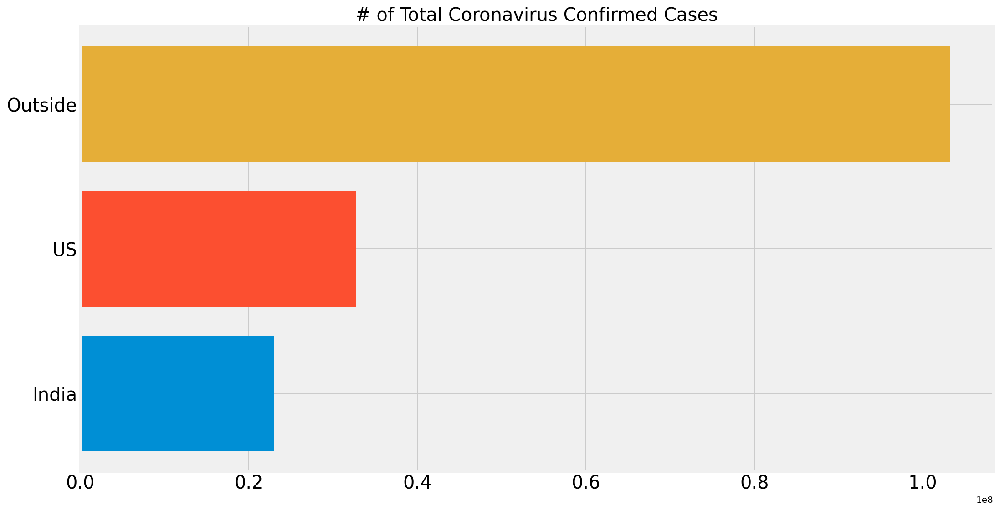

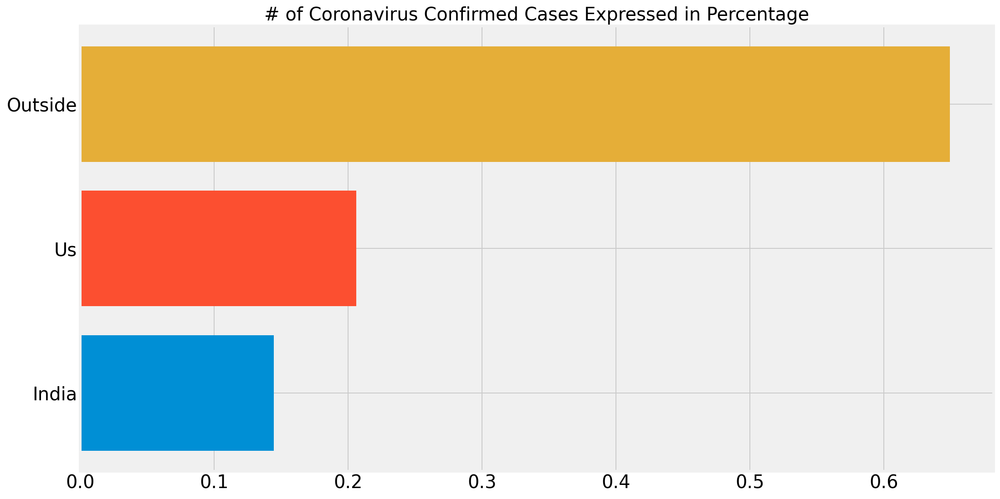

In [47]:
total_globalCases = np.sum(countryConfirmedCases)
india_confirmed = latestData[latestData['Country_Region']=='India']['Confirmed'].sum()
us_confirmed = latestData[latestData['Country_Region']=='US']['Confirmed'].sum()
outside_confirmed = total_globalCases - (india_confirmed + us_confirmed)

plt.figure(figsize=(16, 9))
plt.barh('India', india_confirmed)
plt.barh('US', us_confirmed)
plt.barh('Outside', outside_confirmed)
plt.title('# of Total Coronavirus Confirmed Cases', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()


plt.figure(figsize=(16, 9))
plt.barh('India', india_confirmed/total_globalCases)
plt.barh('Us', us_confirmed/total_globalCases)
plt.barh('Outside', outside_confirmed/total_globalCases)
plt.title('# of Coronavirus Confirmed Cases Expressed in Percentage', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [48]:
# Only show 10 countries with the most confirmed cases, the rest are grouped into the other category
visualUniqueCountries = [] 
visualConfirmedCases = []
others = np.sum(countryConfirmedCases[10:])

for i in range(len(countryConfirmedCases[:10])):
    visualUniqueCountries.append(uniqueCountries[i])
    visualConfirmedCases.append(countryConfirmedCases[i])
    
visualUniqueCountries.append('Others')
visualConfirmedCases.append(others)

In [49]:
def plotBarGraphs(x, y, title):
    plt.figure(figsize=(16, 12))
    plt.barh(x, y)
    plt.title(title, size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
    
# good for a lot x values 
def plotBarGraphs_tall(x, y, title):
    plt.figure(figsize=(19, 18))
    plt.barh(x, y)
    plt.title(title, size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()

#### Bar graphs for some of the significantly affected countries vs all others

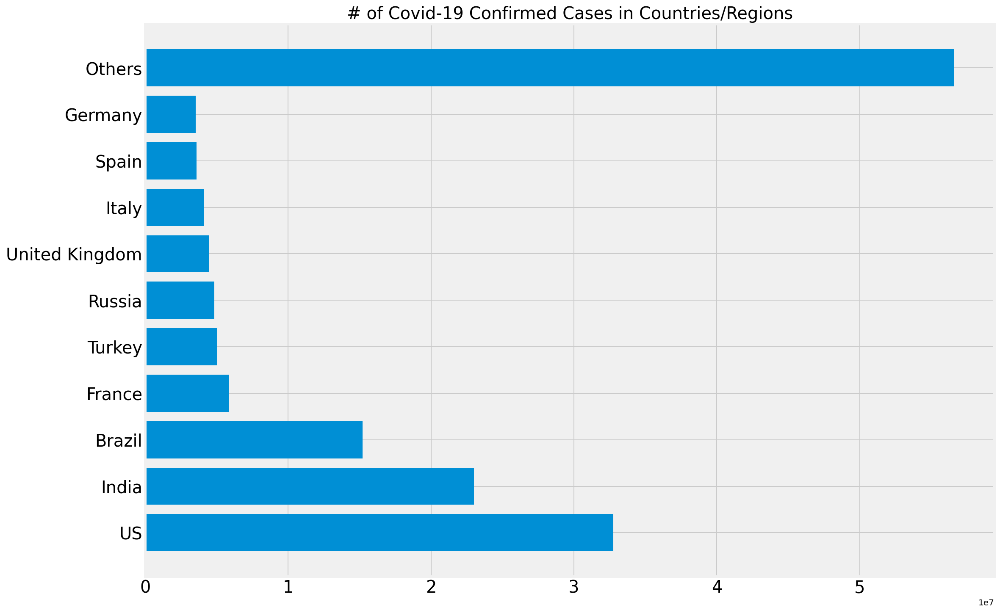

In [50]:
plotBarGraphs(visualUniqueCountries, visualConfirmedCases, '# of Covid-19 Confirmed Cases in Countries/Regions')

In [51]:
def plot_pie_charts(x, y, title):
    # more muted color 
    c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
    plt.figure(figsize=(20,15))
    plt.title(title, size=20)
    plt.pie(y, colors=c,shadow=True, labels=y)
    plt.legend(x, loc='best', fontsize=12)
    plt.show()

#### Country wise total infections

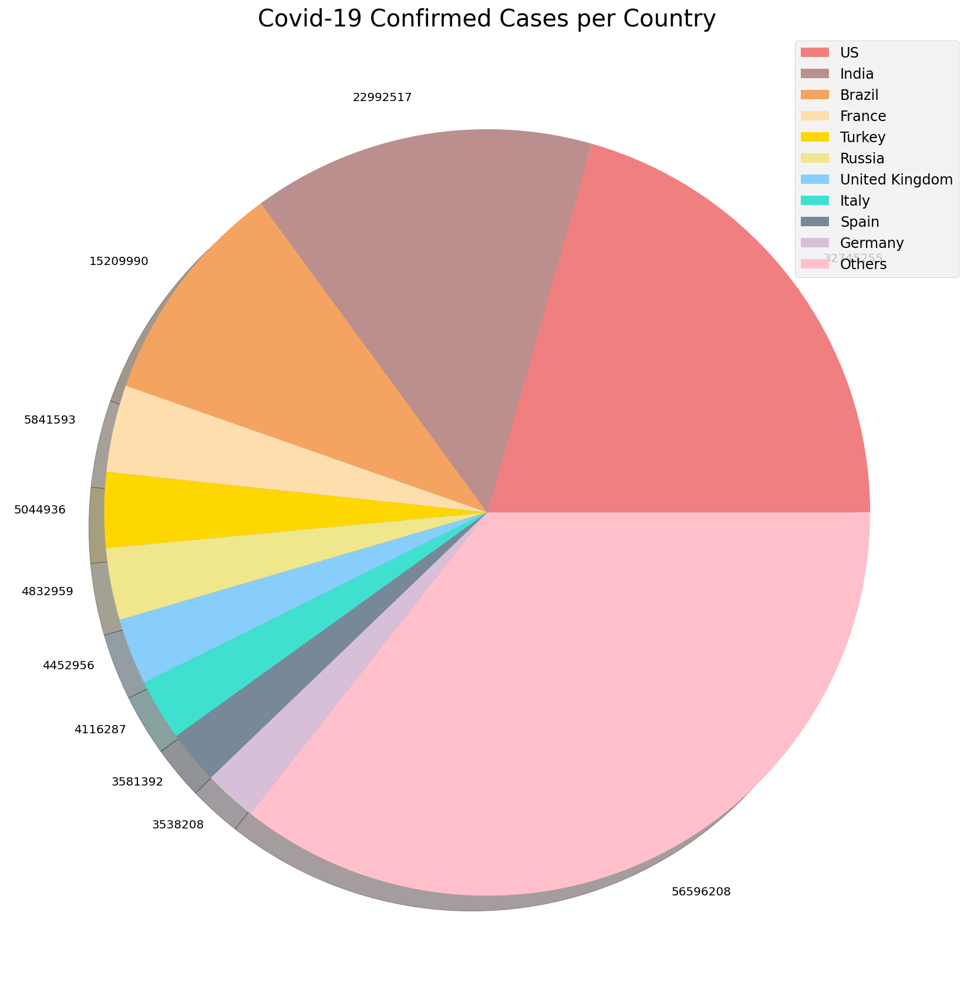

In [52]:
plot_pie_charts(visualUniqueCountries, visualConfirmedCases, 'Covid-19 Confirmed Cases per Country')

### India recent analysis

In [53]:
india = fullGrouped[fullGrouped['Country/Region'] == 'India']

In [54]:
base = alt.Chart(india).mark_bar().encode(
    x='yearmonthdate(Date):O',
).properties(
    width=500
)

In [55]:
red = alt.value("#f54242")
base.encode(y='Confirmed').properties(title='Total confirmed')

alt.Chart(...)

In [56]:
base.encode(y='Deaths', color=red).properties(title='Total Deaths')

alt.Chart(...)

In [57]:
red = alt.value("#f54242")
base.encode(y='New cases').properties(title='Daily new cases')

alt.Chart(...)

In [58]:
base.encode(y='New deaths', color=red).properties(title='Daily new deaths')

alt.Chart(...)

In [59]:
# return the data table with province/state info for a given country
def country_table(country_name):
    states = list(latestData[latestData['Country_Region']==country_name]['Province_State'].unique())
    stateConfirmedCases = []
    stateDeathCases = [] 
    # state_recovery_cases = []
    stateActive = [] 
    stateIncidenceRate = [] 
    stateMortalRate = [] 

    no_cases = [] 
    for i in states:
        cases = latestData[latestData['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            stateConfirmedCases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        states.remove(i)

    states = [k for k, v in sorted(zip(states, stateConfirmedCases), key=operator.itemgetter(1), reverse=True)]
    for i in range(len(states)):
        stateConfirmedCases[i] = latestData[latestData['Province_State']==states[i]]['Confirmed'].sum()
        stateDeathCases.append(latestData[latestData['Province_State']==states[i]]['Deaths'].sum())
    #     state_recovery_cases.append(latestData[latestData['Province_State']==states[i]]['Recovered'].sum())
        stateActive.append(latestData[latestData['Province_State']==states[i]]['Active'].sum())
        stateIncidenceRate.append(latestData[latestData['Province_State']==states[i]]['Incident_Rate'].sum())
        stateMortalRate.append(stateDeathCases[i]/stateConfirmedCases[i])
        
      
    state_df = pd.DataFrame({'State Name': states, 'Number of Confirmed Cases': [format(int(i), ',d') for i in stateConfirmedCases],
                              'Number of Deaths': [format(int(i), ',d') for i in stateDeathCases], 'Number of Active Cases' : [format(int(i), ',d') for i in stateActive], 
                             'Incidence Rate' : stateIncidenceRate, 'Mortality Rate': stateMortalRate})
    # number of cases per country/region
    return state_df

#### INDIA state wise incidence rate and mortality rate

In [60]:
indiaTable = country_table('India')
indiaTable.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Maharashtra,"5,138,973","76,398","593,150",4173.133643,0.014866
1,Karnataka,"1,973,683","19,372","571,026",2921.261893,0.009815
2,Kerala,"1,930,115","5,879","420,076",5406.568948,0.003046
3,Uttar Pradesh,"1,524,767","15,742","225,271",640.974245,0.010324
4,Tamil Nadu,"1,409,237","15,880","152,389",1810.398333,0.011269
5,Delhi,"1,336,218","19,663","85,258",7141.379778,0.014715
6,Andhra Pradesh,"1,302,589","8,791","189,367",2416.525060,0.006749
7,West Bengal,"1,012,604","12,461","126,663",1016.575731,0.012306
8,Chhattisgarh,"863,343","10,742","125,104",2932.926433,0.012442
9,Rajasthan,"773,194","5,825","203,017",954.175419,0.007534


#### US statewise incidence rate and moratality rate

In [61]:
usTable = country_table('US')
usTable.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,California,"3,760,303","62,334",0,457190.181936,0.016577
1,Texas,"2,917,219","50,665",0,2610753.028976,0.017368
2,Florida,"2,272,102","35,783",0,675860.440154,0.015749
3,New York,"2,074,079","52,729",0,502801.379107,0.025423
4,Illinois,"1,356,299","24,590",0,1149349.494803,0.018130
5,Pennsylvania,"1,175,850","26,526",0,616426.742440,0.022559
6,Georgia,"1,110,418","20,368",0,1636038.103773,0.018343
7,Ohio,"1,084,322","19,428",0,802395.668262,0.017917
8,New Jersey,"1,008,046","25,810",0,227245.382458,0.025604
9,North Carolina,"984,251","12,790",0,946583.388386,0.012995


### 5 Data Modelling & Forecasting / Predictions

In [62]:
def plotPredictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(16, 10))
    plt.plot(x, y)
    plt.plot(future_forcast, pred, linestyle='dashed', color=color)
    plt.title('Worldwide Coronavirus Cases Over Time', size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

### 5.1 SVM Predictions

In [63]:
# svmConfirmed = svm_search.best_estimator_
svmConfirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=3, C=0.1)
svmConfirmed.fit(X_train_confirmed, y_train_confirmed)
svmPred = svmConfirmed.predict(future_forcast)

MAE: 26252518.108823694
MSE: 691348704899141.4


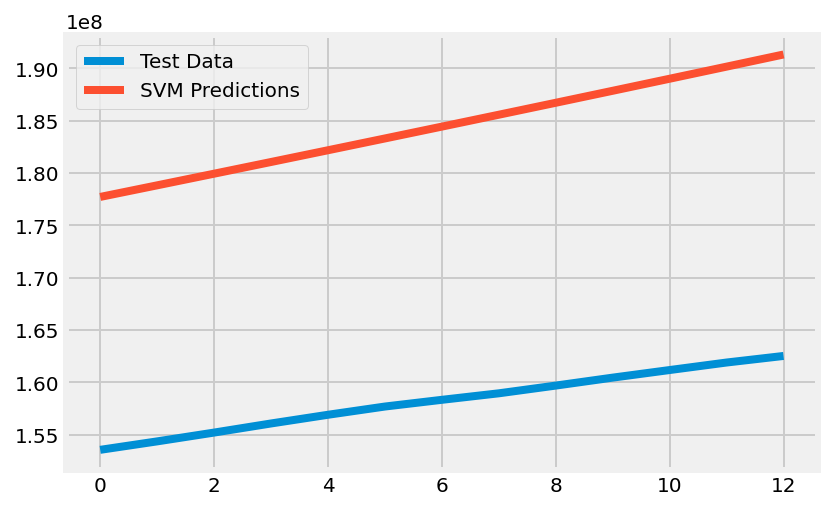

In [64]:
# check against testing data
svm_test_pred = svmConfirmed.predict(X_test_confirmed)
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(svm_test_pred, y_test_confirmed))
print('MSE:',mean_squared_error(svm_test_pred, y_test_confirmed))

### Observations
1. The mean absolure error in case SVM is about 26M, which is not good.
2. compared to world active cases which is about 160M. 
3. after experimenting with degree parameters the following results were achieved. 
4. SVM fails to adjust according to the recent trend and overestimates the number of cases.
5. Above graph plots the SVM predictios on past 12 days, it can be seen that actual and predicted values differ by almost about 25M

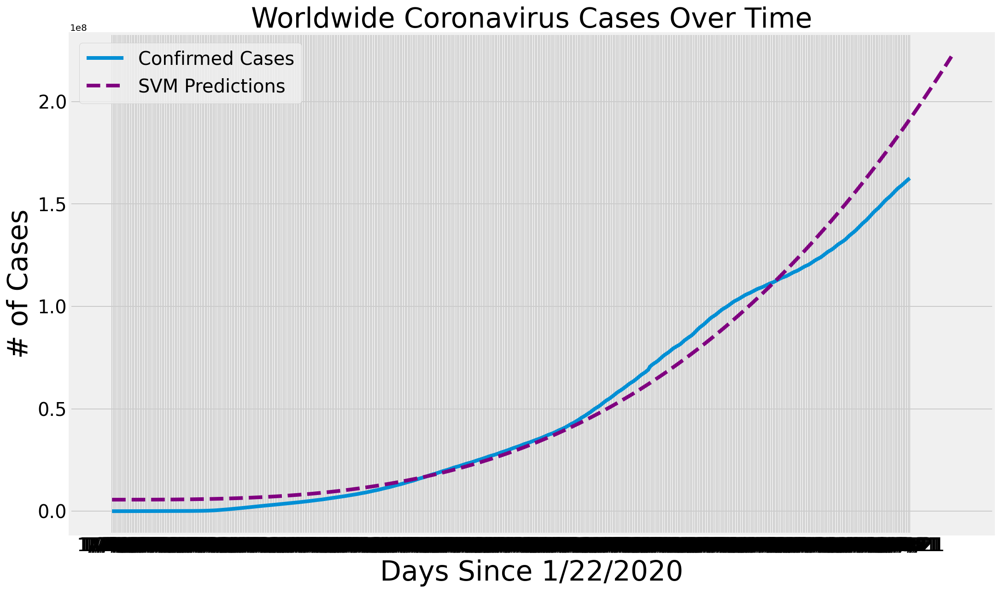

In [65]:
plotPredictions(dates, globalCases, svmPred, 'SVM Predictions', 'purple')

### 5.2 Polynomial Regression Predictions

In [66]:
# transform our data for polynomial regression
poly = PolynomialFeatures(degree=4)
polyXTrainConfirmed = poly.fit_transform(X_train_confirmed)
polyXTestConfirmed = poly.fit_transform(X_test_confirmed)
polyFutureForecast = poly.fit_transform(future_forcast)

bayesian_poly = PolynomialFeatures(degree=4)
bayesian_polyXTrainConfirmed = bayesian_poly.fit_transform(X_train_confirmed)
bayesian_polyXTestConfirmed = bayesian_poly.fit_transform(X_test_confirmed)
bayesian_polyFutureForecast = bayesian_poly.fit_transform(future_forcast)

In [67]:
# polynomial regression
linear_model = LinearRegression(normalize=True, fit_intercept=False)
linear_model.fit(polyXTrainConfirmed, y_train_confirmed)
test_linearPred = linear_model.predict(polyXTestConfirmed)
linearPred = linear_model.predict(polyFutureForecast)
print('MAE:', mean_absolute_error(test_linearPred, y_test_confirmed))
print('MSE:',mean_squared_error(test_linearPred, y_test_confirmed))

MAE: 9692742.51994531
MSE: 96465858926672.6


In [68]:
print(linear_model.coef_)

[[-1.00027748e+07  2.77403062e+05 -2.38348432e+03  1.09179528e+01
  -1.18824496e-02]]


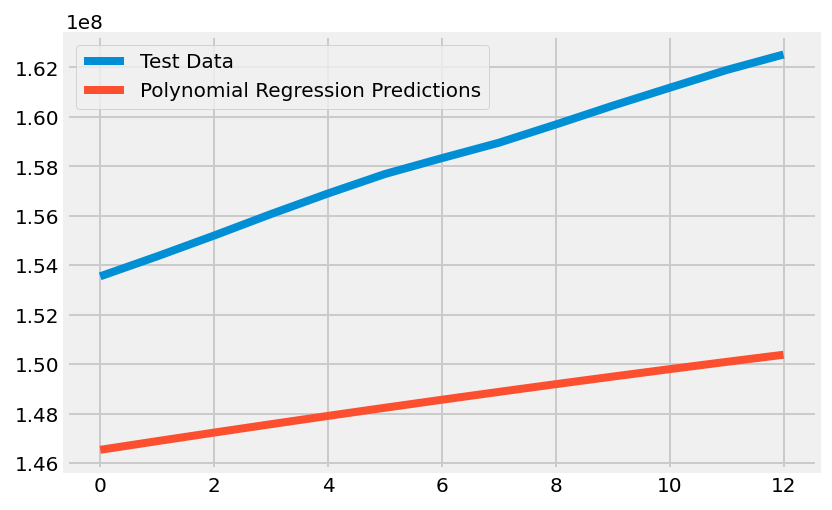

In [69]:
plt.plot(y_test_confirmed)
plt.plot(test_linearPred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])

### Observations
1. Compared to the SVM, Polynomial regression perfoms much better.
2. The mean Absolute error for Polynomial Regression is about 9M
3. Based on recent trend polynomial regression adjusts the predictions.
4. with the variations with the parameters the Polynomial regresion produces best results with above parameters

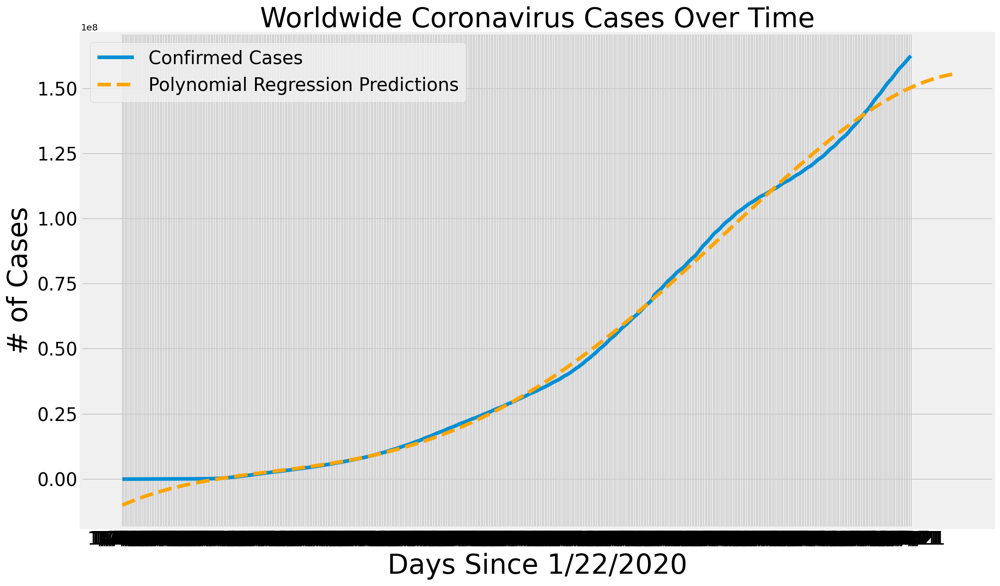

In [70]:
plotPredictions(dates, globalCases, linearPred, 'Polynomial Regression Predictions', 'orange')

#### Polynomial regression seem to underpredict the cases for next days

### 5.3 Baysian Ridge Regression Predictions

In [71]:
# bayesian ridge polynomial regression
tol = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]
alpha_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
alpha_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
normalize = [True, False]

bayesian_grid = {'tol': tol, 'alpha_1': alpha_1, 'alpha_2' : alpha_2, 'lambda_1': lambda_1, 'lambda_2' : lambda_2, 
                 'normalize' : normalize}

In [72]:
bayesian = BayesianRidge(fit_intercept=False)
bayesian_search = RandomizedSearchCV(bayesian, bayesian_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=40, verbose=1)
bayesian_search.fit(bayesian_polyXTrainConfirmed, y_train_confirmed)
bayesian_search.best_params_

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:    1.4s finished


{'alpha_1': 1e-07,
 'alpha_2': 0.001,
 'lambda_1': 0.001,
 'lambda_2': 0.0001,
 'normalize': True,
 'tol': 0.0001}

#### Using the parameters to predict the global cases for next 25 days

In [73]:
bayesian_confirmed = bayesian_search.best_estimator_
test_bayesianPred = bayesian_confirmed.predict(bayesian_polyXTestConfirmed)
bayesianPred = bayesian_confirmed.predict(bayesian_polyFutureForecast)
mean_absolute_error(test_bayesianPred, y_test_confirmed)
print('MAE:', mean_absolute_error(test_bayesianPred, y_test_confirmed))
print('MSE:',mean_squared_error(test_bayesianPred, y_test_confirmed))

MAE: 6132078.048214947
MSE: 38654993962427.12


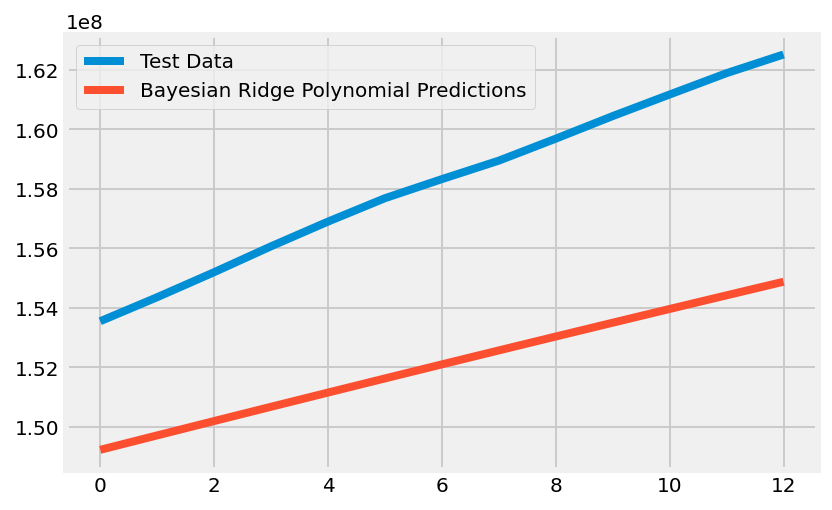

In [74]:
plt.plot(y_test_confirmed)
plt.plot(test_bayesianPred)
plt.legend(['Test Data', 'Bayesian Ridge Polynomial Predictions'])

### Observations
1. The bayesian ridge regression performs the best in terms of above two models
2. RandomizedSeachCV with various tol, lambda and alpha values predicts the best estimtor
3. The mean absolute error with BRR is about 6M which is reasonable
4. The predictions in the graph below are predicting general trend accurately for next 25 days

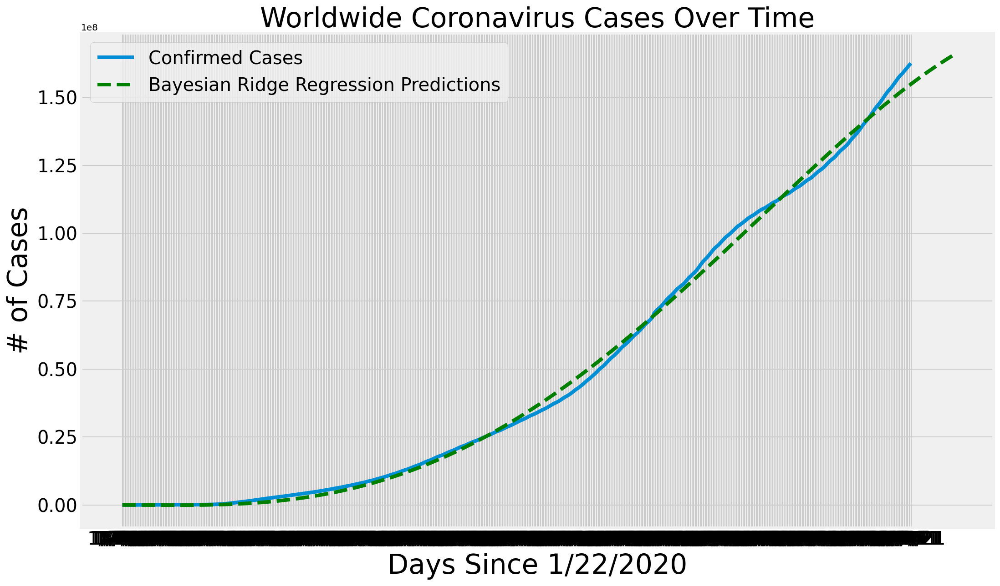

In [75]:
plotPredictions(dates, globalCases, bayesianPred, 'Bayesian Ridge Regression Predictions', 'green')

### 7. MODEL COMPARISION

In [76]:
df_comp=pd.DataFrame({'Metrics':['Mean Squared Error','Mean absolute error']})
df_comp['Support Vector Machine']=[mean_absolute_error(svm_test_pred, y_test_confirmed), mean_squared_error(svm_test_pred, y_test_confirmed)]
df_comp['Polynomial Regression']=[mean_absolute_error(test_linearPred, y_test_confirmed), mean_squared_error(test_linearPred, y_test_confirmed)]
df_comp['Bayesian Ridge Regression']=[mean_absolute_error(test_bayesianPred, y_test_confirmed), mean_squared_error(test_bayesianPred, y_test_confirmed)]

df_comp.set_index('Metrics', drop=True, inplace=True)
df_comp.head()

,Support Vector Machine,Polynomial Regression,Bayesian Ridge Regression
Metrics,,,
Mean Squared Error,2.625252e+07,9.692743e+06,6.132078e+06
Mean absolute error,6.913487e+14,9.646586e+13,3.865499e+13


### Observations:

- SVM has the highest mean absolute error, then polynomial regression and then Bayesian Ridge Regression
- Bayesian model was anticipated to be the best because of the training dataset size.
- When compared to the total global cases 160M, the best accuracy trend is produced by Bayesian Ridge Regression with the MAE of 6M. 

# PART 2.2- INDIA STATE-WISE analysis

### Table of contents

1.  Data Visualization (As data is clean) 
    <br>
2. Data Pre-processing<br>
    2.1 Generating daily new casses and deaths<br>
    2.2 Moving Average<br>
    2.3 State-wise Moving average daily cases
    <br>
3. Modelling <br>
    3.1 Arima <br>
    3.2 Prophet <br>
    3.3 Holt-Winters <br>
    <br>
4. Model Comparision
<br>
        
5. Forcasting 
<br>
6. Conclusion

In [5]:
india_covid=pd.read_csv('covid_19_india.csv')

In [6]:
india_covid

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,1,2020-01-30,6:00 PM,Kerala,1,0,0,0,1
1,2,2020-01-31,6:00 PM,Kerala,1,0,0,0,1
2,3,2020-02-01,6:00 PM,Kerala,2,0,0,0,2
3,4,2020-02-02,6:00 PM,Kerala,3,0,0,0,3
4,5,2020-02-03,6:00 PM,Kerala,3,0,0,0,3
...,...,...,...,...,...,...,...,...,...
14685,14686,2021-05-08,8:00 AM,Telangana,-,-,413225,2666,487199
14686,14687,2021-05-08,8:00 AM,Tripura,-,-,34270,405,37208
14687,14688,2021-05-08,8:00 AM,Uttarakhand,-,-,158872,3430,229993
14688,14689,2021-05-08,8:00 AM,Uttar Pradesh,-,-,1184688,14873,1453679


In [79]:
#state-wise cases
india_cases = india_covid.groupby('State/UnionTerritory')['Confirmed','Deaths','Cured'].max().reset_index()
india_cases.head()

,State/UnionTerritory,Confirmed,Deaths,Cured
0,Andaman and Nicobar Islands,6311,72,6030
1,Andhra Pradesh,1245374,8519,1050160
2,Arunachal Pradesh,19802,60,17849
3,Assam,283313,1578,246242
4,Bihar,567269,3139,449063


In [80]:
#checking for nul values
india_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40 entries, 0 to 39
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   State/UnionTerritory  40 non-null     object
 1   Confirmed             40 non-null     int64 
 2   Deaths                40 non-null     int64 
 3   Cured                 40 non-null     int64 
dtypes: int64(3), object(1)
memory usage: 1.4+ KB


In [81]:
df_confirmed=confirmedDF.copy()
df_deaths=deathsDF.copy()
df_recovered=recoveredDF.copy()

## 1. Data Visualization

### 1.1. sorted State-wise visulization

In [82]:
#sorted State-wise visulization. showing sorted states with highest cases
india_cases['Active'] = india_cases['Confirmed'] - (india_cases['Deaths']+india_cases['Cured'])
india_cases["Cure Rate (per 100)"] = np.round(100*india_cases["Cured"]/india_cases["Confirmed"],2)
india_cases["Death Rate (per 100)"] = np.round(100*india_cases["Deaths"]/india_cases["Confirmed"],2)

india_cases.sort_values('Confirmed', ascending= False).fillna(0).style.background_gradient(cmap='Blues',subset=["Confirmed"])\
                        .background_gradient(cmap='Blues',subset=["Deaths"])\
                        .background_gradient(cmap='Blues',subset=["Cured"])\
                        .background_gradient(cmap='Blues',subset=["Active"])\
                        .background_gradient(cmap='Blues',subset=["Death Rate (per 100)"])\
                        .background_gradient(cmap='Blues',subset=["Cure Rate (per 100)"])

,State/UnionTerritory,Confirmed,Deaths,Cured,Active,Cure Rate (per 100),Death Rate (per 100)
22,Maharashtra,4996758,74413,4265326,657019,85.360000,1.490000
17,Karnataka,1838885,17804,1284420,536661,69.850000,0.970000
18,Kerala,1824856,5682,1416177,402997,77.600000,0.310000
37,Uttar Pradesh,1453679,14873,1184688,254118,81.500000,1.020000
32,Tamil Nadu,1323965,15171,1173439,135355,88.630000,1.150000
10,Delhi,1292867,18739,1183093,91035,91.510000,1.450000
1,Andhra Pradesh,1245374,8519,1050160,186695,84.320000,0.680000
39,West Bengal,954282,12076,818108,124098,85.730000,1.270000
7,Chhattisgarh,830117,10158,688918,131041,82.990000,1.220000
30,Rajasthan,720799,5346,516306,199147,71.630000,0.740000


### Comments
- Maharasthra has the highest number of confirmed casses, deaths and the highest death rate as well.  
- Active casses in other states in 1/3rd of Maharashtra 

### 1.2. State-wise spread over time

In [7]:
formated_india = india_covid.groupby(['Date', 'State/UnionTerritory'])['Confirmed'].max()
formated_india=formated_india.reset_index()

In [8]:
formated_india['Date'] = pd.to_datetime(formated_india['Date'])
formated_india['Date'] = formated_india['Date'].dt.strftime('%m/%d/%Y')
formated_india['size'] = formated_india['Confirmed'].pow(1.2)

In [9]:
#selecting values from feb 2021
formated_india_new=formated_india.iloc[11198:,:]
formated_india_new

,Date,State/UnionTerritory,Confirmed,size
11198,02/01/2021,Andaman and Nicobar Islands,4994,2.742447e+04
11199,02/01/2021,Andhra Pradesh,887836,1.374040e+07
11200,02/01/2021,Arunachal Pradesh,16828,1.178254e+05
11201,02/01/2021,Assam,217141,2.535655e+06
11202,02/01/2021,Bihar,259563,3.141169e+06
...,...,...,...,...
14685,05/08/2021,Telangana,487199,6.687252e+06
14686,05/08/2021,Tripura,37208,3.053259e+05
14687,05/08/2021,Uttar Pradesh,1453679,2.482917e+07
14688,05/08/2021,Uttarakhand,229993,2.716799e+06


In [10]:
fig = px.scatter_geo(formated_india_new, locations="State/UnionTerritory", geojson="https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson", 
                     featureidkey='properties.ST_NM',color="Confirmed", size='size', hover_name="State/UnionTerritory", 
                     range_color= [0, 5000000], 
                     projection="natural earth", animation_frame="Date", 
                     title='COVID-19: Spread Over Time india', color_continuous_scale="portland")

plotly.offline.iplot(fig)

### Comments
- When you zoom in India, Scatter geo shows the increase in casses over time to showcast how the number of casses suddenly started to increase since mid march.  
- As we notice, suddenly after 15th march, the casses rise exponentially in india. 
- In Maharashtra, the scale jumps from 2 million to 5 million withing a span of 2 months

## 2. Data pre-processing

In a lot of projects available on the internet, people have made predictions on confirmed casses which are addition of previous days casses. It generates a uniform graph. In order to something, we have caluclated daily new casses to make predictions on the daily new casses. 

### 2.1 Generating daily new casses and deaths

In [88]:
states = list(india_covid['State/UnionTerritory'].unique())
states.remove('Unassigned')

#training on data since start 
latest = india_covid[india_covid['Date'] >= '2020-03-01']
india_cases = latest.groupby('State/UnionTerritory')['Confirmed','Deaths','Cured'].max().reset_index()

latest['Active'] = latest['Confirmed'] - (latest['Deaths']- latest['Cured'])

In [89]:
state_cases = india_cases.sort_values('Confirmed', ascending= False).fillna(0) 

#top 6 states as they are most susceptible
states =list(state_cases['State/UnionTerritory'])[0:6]
states

['Maharashtra', 'Karnataka', 'Kerala', 'Uttar Pradesh', 'Tamil Nadu', 'Delhi']

In [90]:
s_confirmed = {} #daily confirmed
s_deaths = {} #daily deaths
s_recovered = {} #daily recovered
s_active = {} #daily active
s_dates = {} #dates for each state

for state in states:
    df = latest[latest['State/UnionTerritory'] == state].reset_index()
    k, l, m ,n = [],[],[],[]
    for i in range(1,len(df)):
        k.append(df['Confirmed'][i]-df['Confirmed'][i-1])
        l.append(df['Deaths'][i]-df['Deaths'][i-1])
        m.append(df['Cured'][i]-df['Cured'][i-1])
        n.append(df['Active'][i]-df['Active'][i-1])
        
    # daily numbers for each state
    s_confirmed[state] = k
    s_deaths[state] = l
    s_recovered[state] = m
    s_active[state] = n
    date = list(df['Date'])
    s_dates[state] = date[1:]

In [91]:
cols=date[1:]
cols.insert(0,'states')
len(cols)

433

### Comments:

-The daily casses have been generated in the step and we will calculate the moving average for these states to get a uniform data for future prediction

### 2.2 Moving Average

In [92]:
#calculating moving average to smoothen the data 

def calc_movingaverage(values ,N):    
    cumsum, moving_aves = [0], [0,0]
    for i, x in enumerate(values, 1):
        cumsum.append(cumsum[i-1] + x)
        if i>=N:
            moving_ave = (cumsum[i] - cumsum[i-N])/N
            moving_aves.append(moving_ave)
    return moving_aves

In [93]:
#storing moving average values
state_ma={}
for state in states:
    state_ma[state]=calc_movingaverage(s_confirmed[state],5)

In [94]:
plt.style.use('ggplot')
%matplotlib inline
#from IPython.display import set_matplotlib_formats
#set_matplotlib_formats('retina')

### 2.3. State-wise Moving average daily cases 

In this step, we will again try to visualize the daily new casses in the top 6 states of India.

In [95]:
colors=['red', 'blue', 'green', 'orange', 'darkgreen', 'black']
def stat_analysis(state, i):
    plt.figure(figsize=(10,8))
    plt.xlabel('Dates', fontsize=18)
    plt.ylabel('New cases', fontsize=18)
    plt.title(state)
    plt.xticks(rotation=90)
    plt.plot(range(len(s_dates[state][2:])), state_ma[state], color=colors[i])
    plt.show()

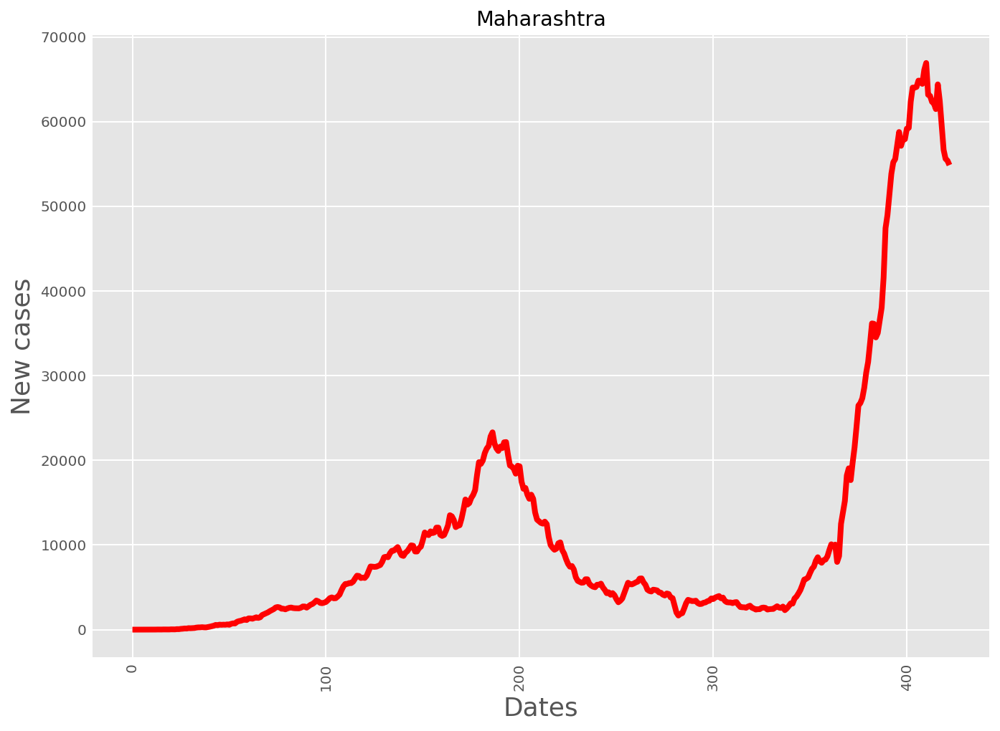

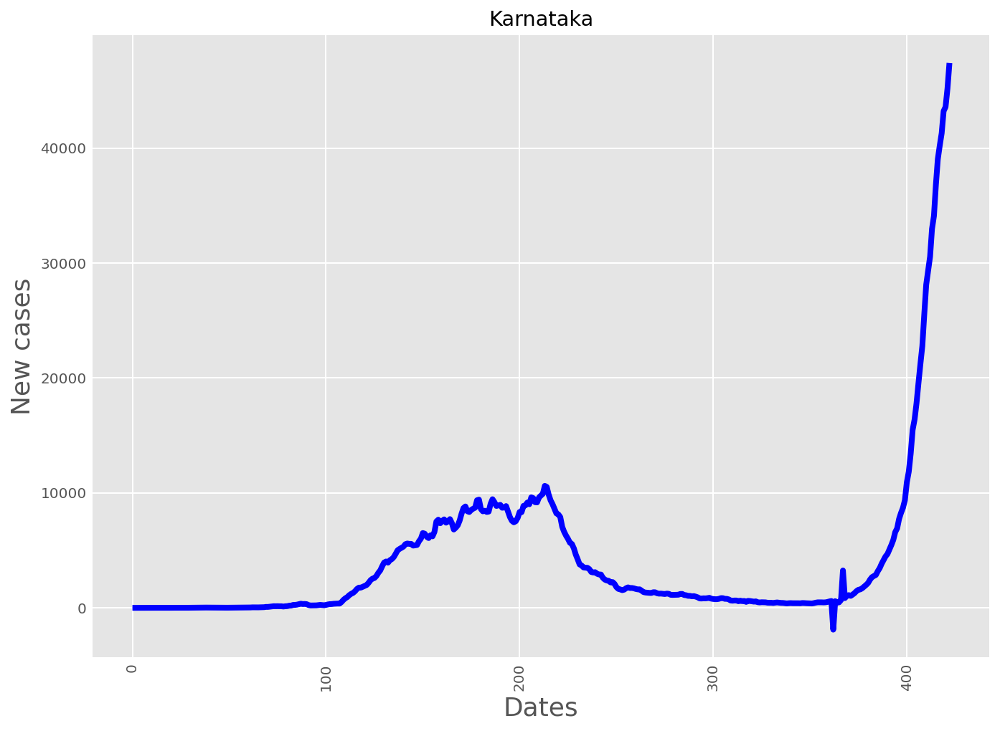

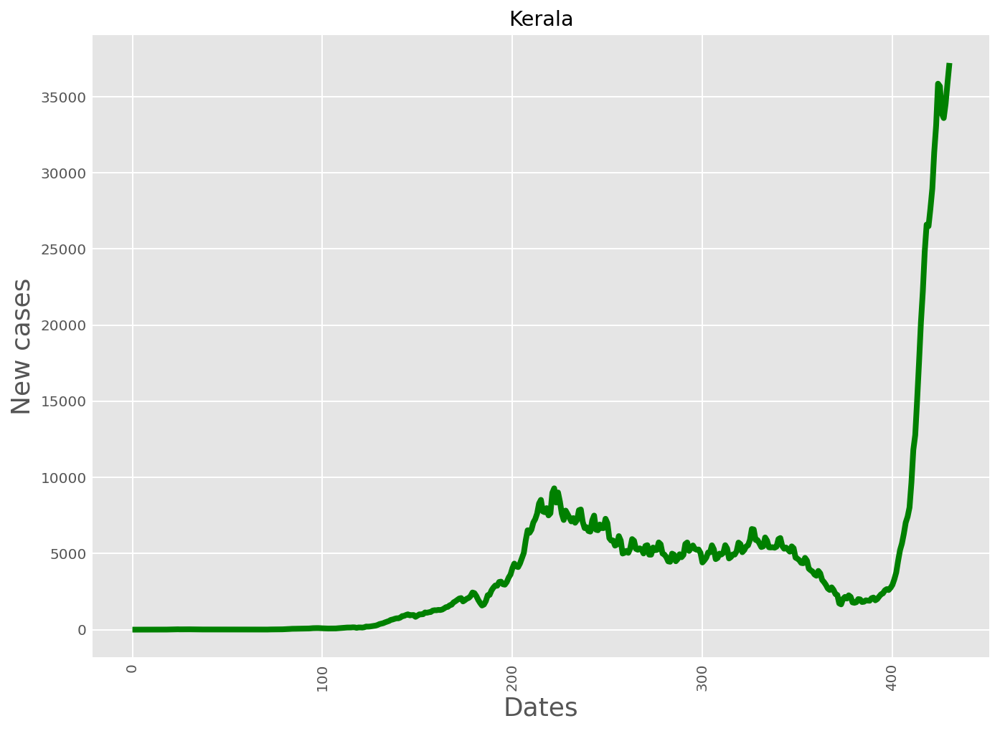

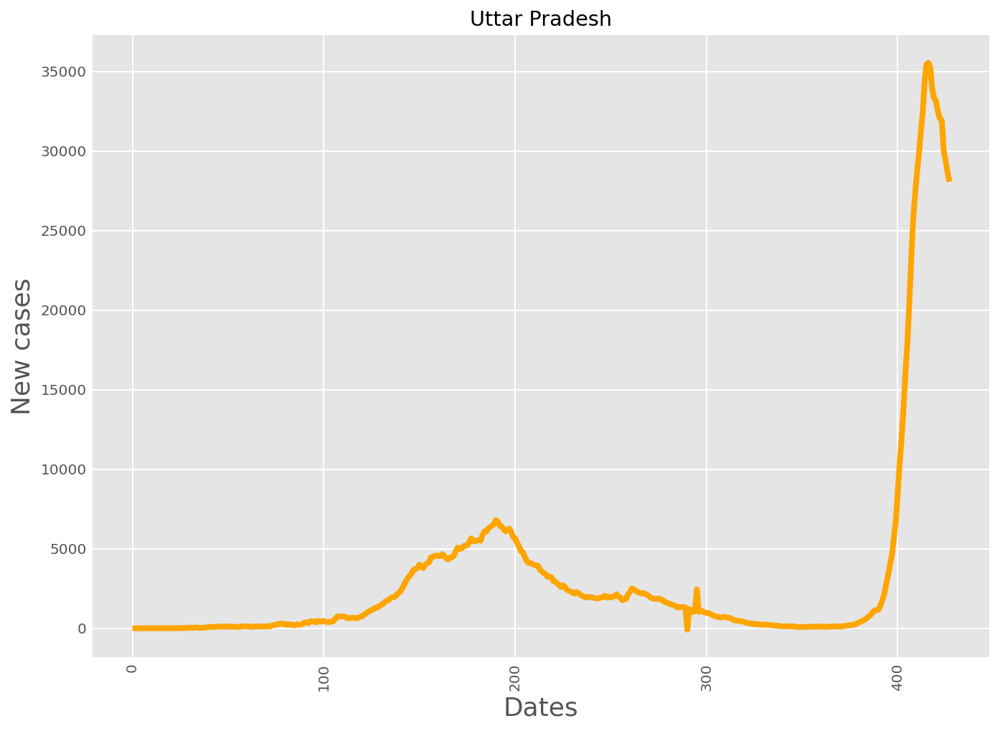

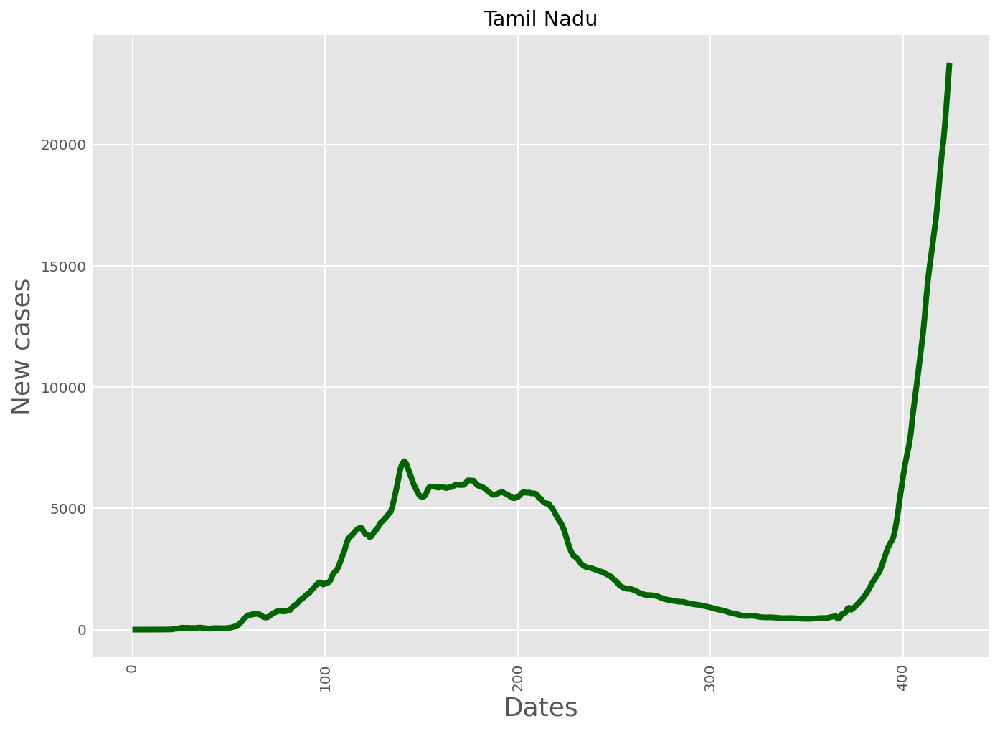

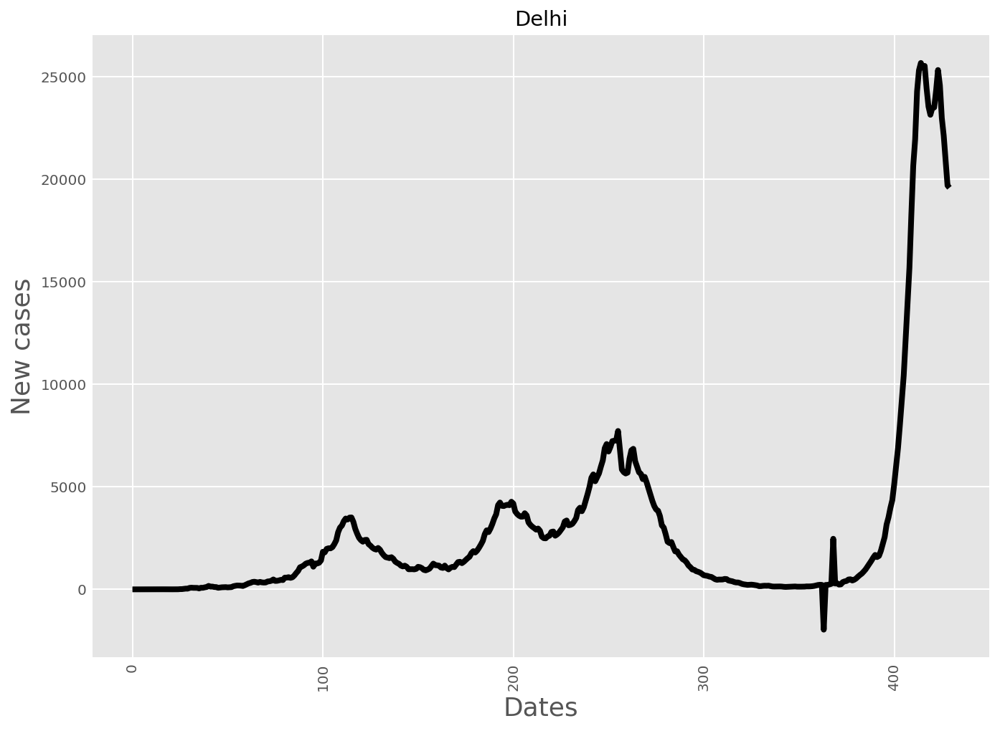

In [96]:
i=0
for state in states:
    stat_analysis(state, i)
    i=i+1

### Observations:

- For nearly every state in India, we see that around 200th day of covid(October-November), a peak was reached and after that the casses started decreasing. But in the last 50 days, the casses  have started to increase at an exponential rate marking the highest casses recorded in India.
- For some states like Tamil Nadu, Kerala, Karnataka the number of casses are still rising
- While, other states like Delhi, Maharashtra and Uttar pradesh have started to show some improvements. 
- Our aim here is to predict the future casses so the government can take appropriate steps to accomodate new critical patients 

## 3. Modelling

##### In order to predict the future, we need to test the data on some models to get the best model 

### 3.1 Arima Model

In [97]:
from statsmodels.tsa.arima_model import ARIMA
import time
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error,mean_absolute_error

def forcast(data, tt, state):
    X = data.values
    maxx=max(X)                              #max value for graph plotting 
    scaler = MinMaxScaler()                  #Standardizing for model comparisions 
    X=scaler.fit_transform(X.reshape(-1, 1))
    size = int(len(X) * tt)
    train, test = X[0:size], X[size:len(X)]  #train-test split
    history = [x for x in train]
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=(5,1,0)) #initializing the model and training on whole data 
        model_fit = model.fit(disp=0)
        out = model_fit.forecast()
        y_pred = out[0]                       #predictions 
        predictions.append(y_pred)
        obs = test[t]
        history.append(obs)


    mae= mean_absolute_error(test, predictions) #mean absolute error
    mse= mean_squared_error(test, predictions)  #mean squared error
    print('\n Test MAE: %.4f' % mae)

    plt.rcParams["figure.figsize"] = (8,7)
    preds = np.append(train, predictions)
    
    plt.title(state, fontsize=18)
    plt.xlabel('Last 30 days', fontsize=18)
    plt.ylabel('New cases', fontsize=18)
    
    #plotting for only last 30 days to get a better idea about testing 
    plt.plot(np.multiply(preds[-30:],maxx), color='green', linewidth=3, label="Predicted Data")
    plt.plot(np.multiply(X[-30:],maxx), color='blue', linewidth=2, label="Original Data")
    plt.axvline(x=int(((len(X[-30:])*tt)-1)*0.87), linewidth=2, color='purple')
    plt.legend()
    plt.show()
    
    return mae, mse

Maharashtra

 Test MAE: 0.0183


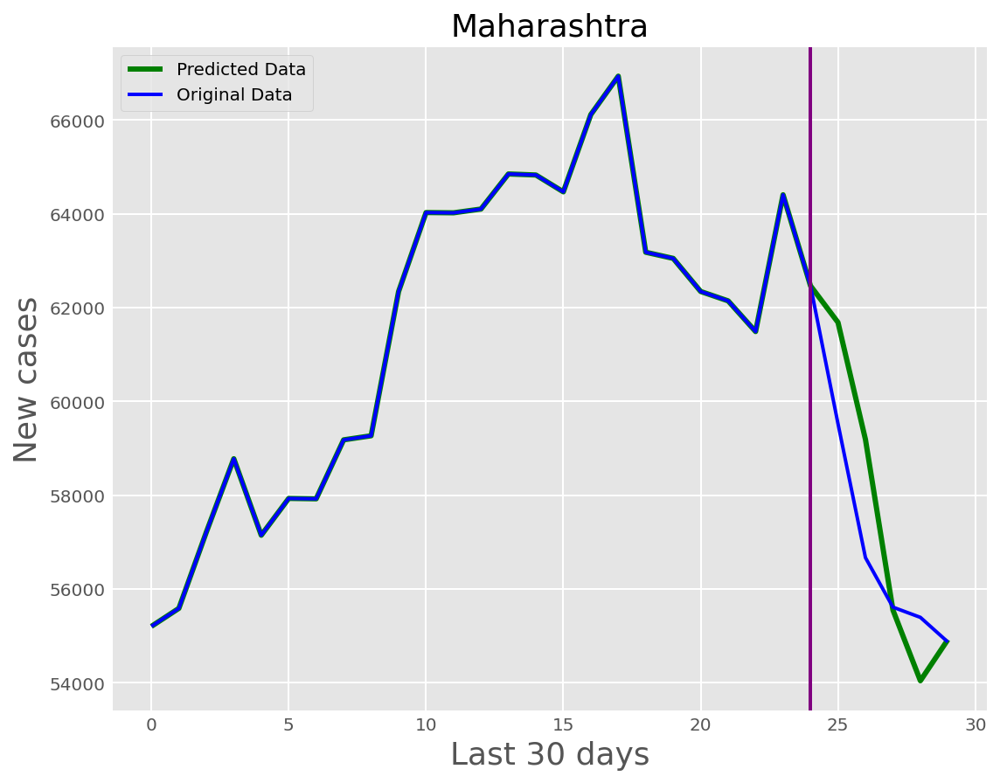

Karnataka

 Test MAE: 0.0135


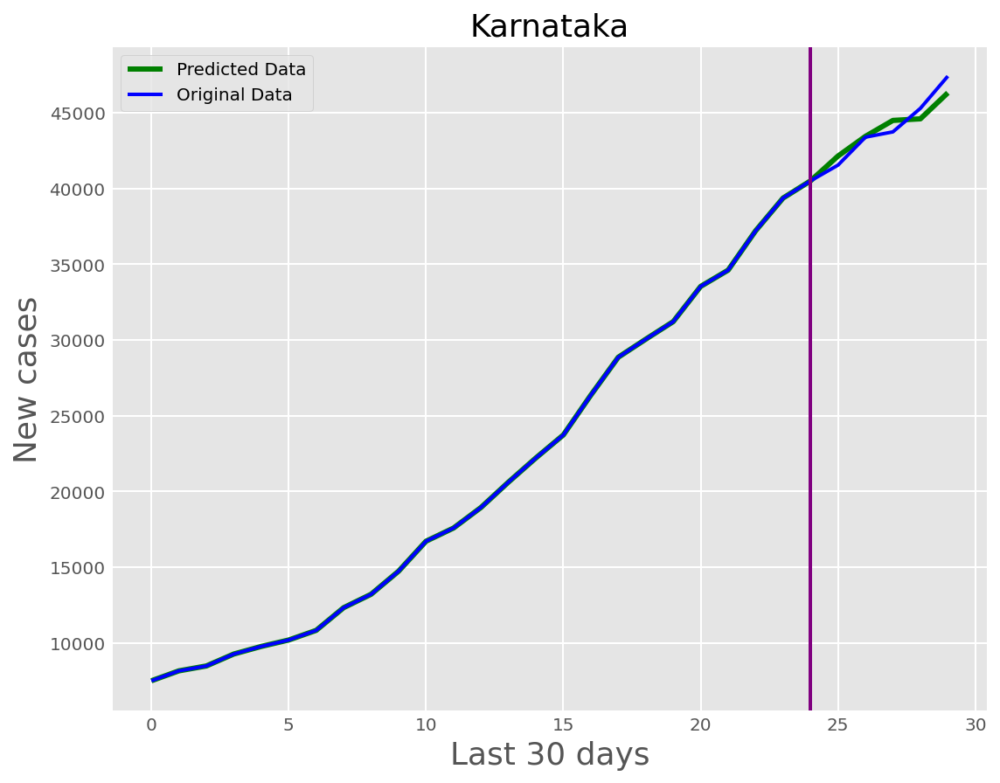

Kerala

 Test MAE: 0.0333


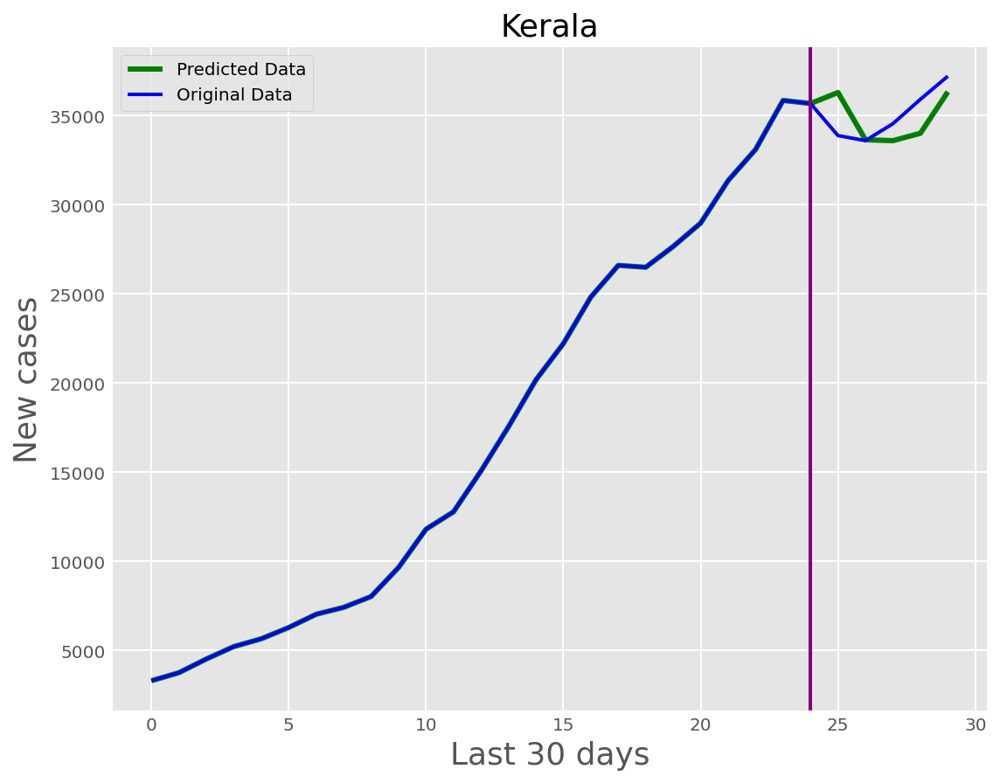

Uttar Pradesh

 Test MAE: 0.0129


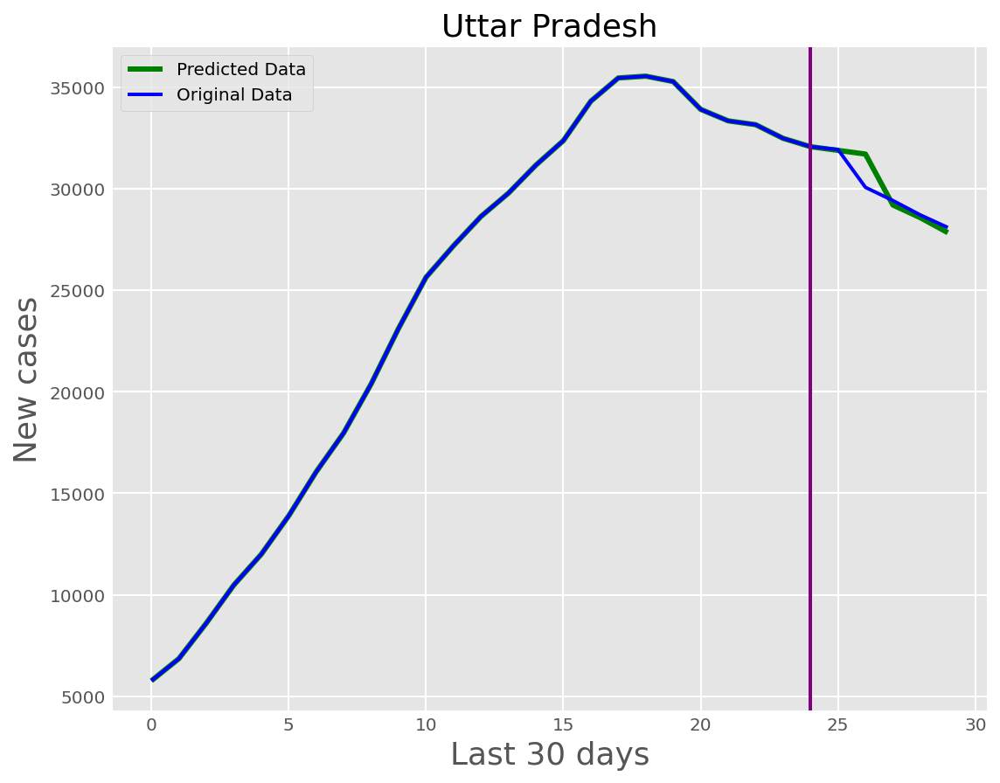

Tamil Nadu

 Test MAE: 0.0066


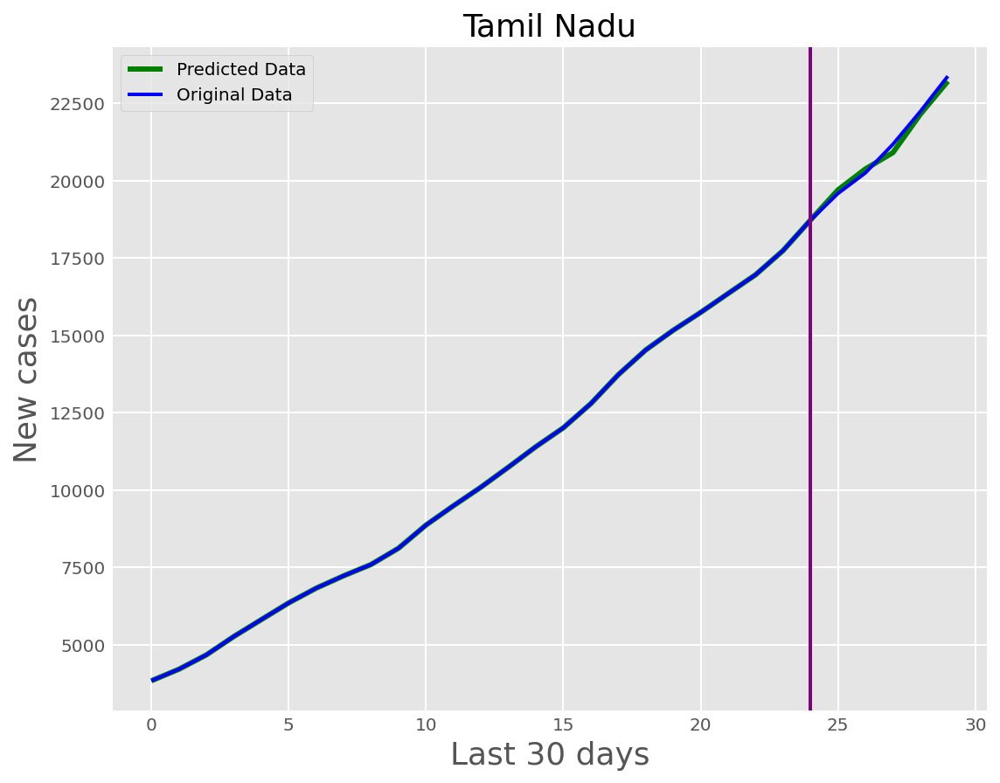

Delhi

 Test MAE: 0.0283


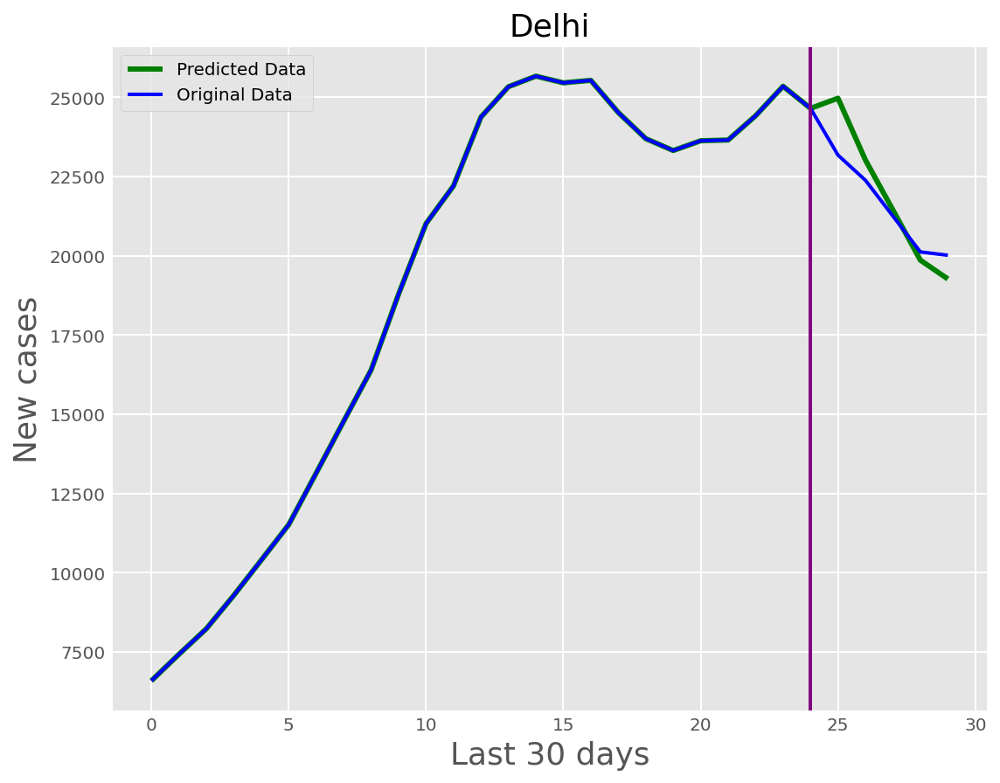

In [98]:
mae_arima={}
mse_arima={}
start=time.time()
for state in states:
    print(state)
    
    #making a dataframe of the data
    data=pd.DataFrame(s_dates[state][:-2], columns=['time'])
    data['y']=state_ma[state]
    data=data.set_index(data['time'])
    data=data.drop(columns='time')
    
    # Train to Test ratio
    tt = 0.99 
    mae,mse=forcast(data['y'][2:], tt, state)
    mae_arima[state]=mae
    mse_arima[state]=mse

end=time.time()
time_arima=(end-start)/60

In [99]:
mae_mean_arima=round(np.average(list(mae_arima.values())),4)
mse_mean_arima=round(np.average(list(mse_arima.values())),4)

In [100]:
print('Mean absolute error(MAE) for all 6 states(Average):',mae_mean_arima)
print('Mean square error(MSE) for all 6 states(Average):',mse_mean_arima)

Mean absolute error(MAE) for all 6 states(Average): 0.0188
Mean square error(MSE) for all 6 states(Average): 0.0007


### Obervations:

- Arima model works for seasonal as well as non seasonal data. We can specify the seasonality and order in a parameter here.
- After trying different values of p,d,q in auto-arima, the best values that the model got was (5,1,0) i.e. 5th order auto regressive model, 1 difference between response variable data, 0 moving average as we have already done that.
- We get a very good MAE and MSE because Arima model is by far the best forcasting univariat model

### 3.2 FBprophet Model

In [101]:
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, add_changepoints_to_plot

In [106]:
def prophet_train(data, tt_ratio,state):

    X = data
    maxx=max(data['y'])
    scaler = MinMaxScaler()
    size = int(len(X) * tt_ratio)
    train, test = X[0:size], X[size:len(X)]

    
    prophet_df = pd.DataFrame()
    prophet_df["ds"] = train.index
    prophet_df['y'] = train.values 
    
    predictions = list()
    k=0
    for idx,row in test.iterrows():
        m = Prophet(daily_seasonality=False, yearly_seasonality=False)
        m.fit(prophet_df)
        future=m.make_future_dataframe(periods=1)
        prop_forecast=m.predict(future)
        yhat = prop_forecast.yhat.values[-1]
        predictions.append(yhat)
        obs=row['y']
        prophet_df.loc[len(prophet_df.index)] = [idx,obs]
        k=k+1

        
    test_error=scaler.fit_transform(test.values.reshape(-1,1))
    predictions_error=scaler.fit_transform(np.array(predictions).reshape(-1,1))
        
    error_mae = mean_absolute_error(test_error, predictions_error)
    error_mse = mean_squared_error(test_error, predictions_error)
    
    plt.rcParams["figure.figsize"] = (10,8)
    preds = np.append(train.values, predictions)

    plt.title(state, fontsize=18)
    plt.xlabel('Last 30 days', fontsize=18)
    plt.ylabel('New cases', fontsize=18)

    plt.plot(preds[-30:], color='green', linewidth=3, label="Predicted Data")
    plt.plot(data.values[-30:], color='blue', linewidth=2, label="Original Data")
    plt.axvline(x=(((len(X[-30:])*tt_ratio)-1)*0.87), linewidth=2, color='red')
    plt.legend()
    plt.show()

    return error_mae,error_mse

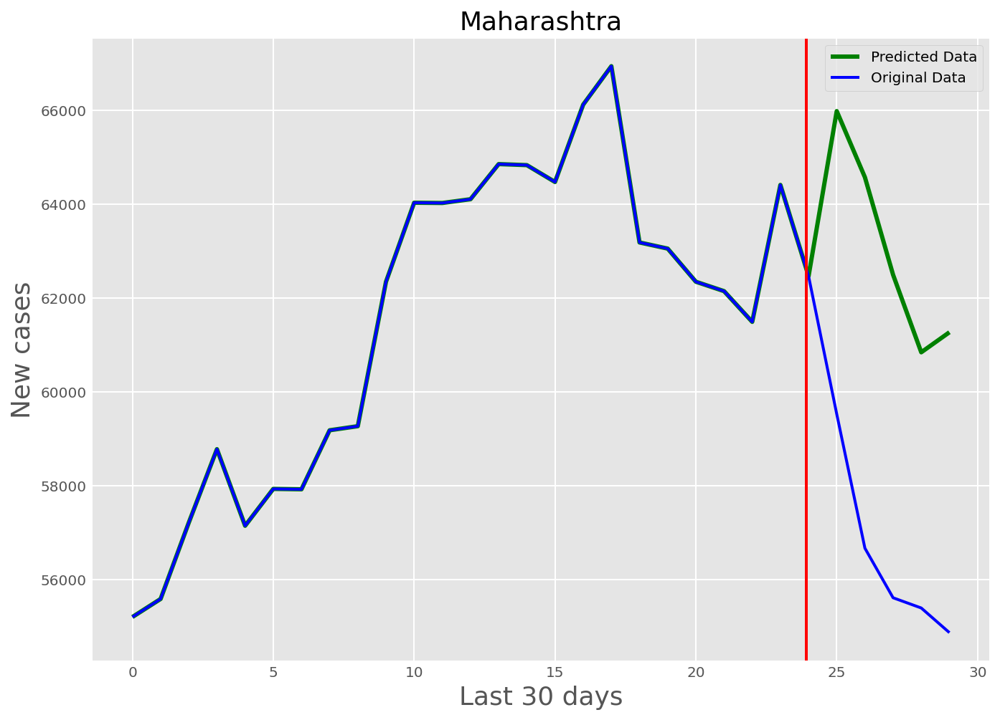

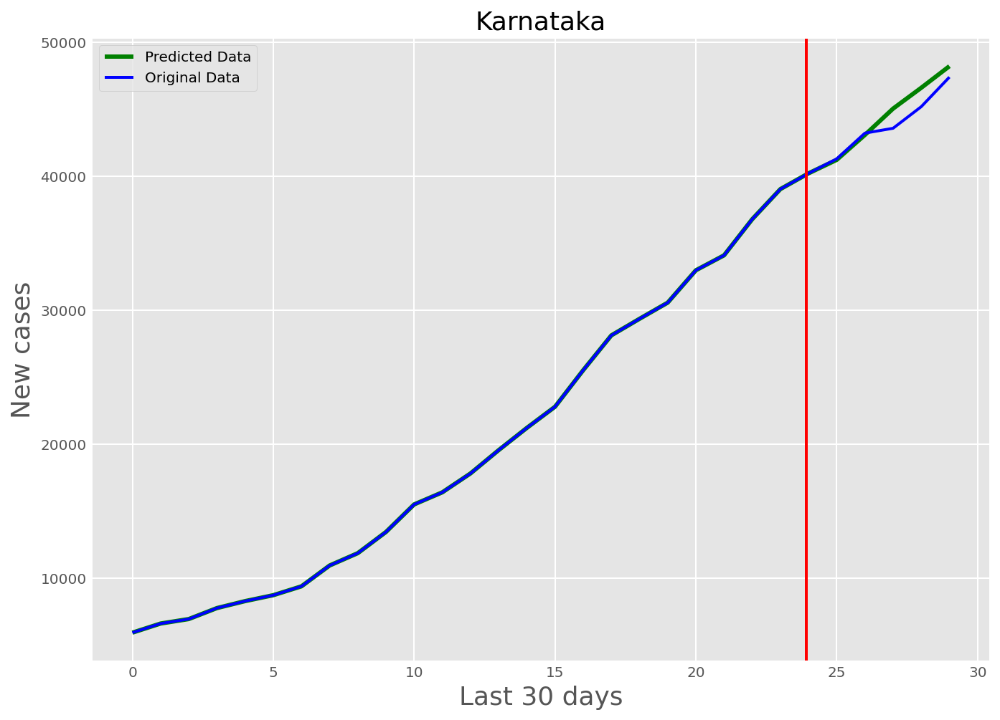

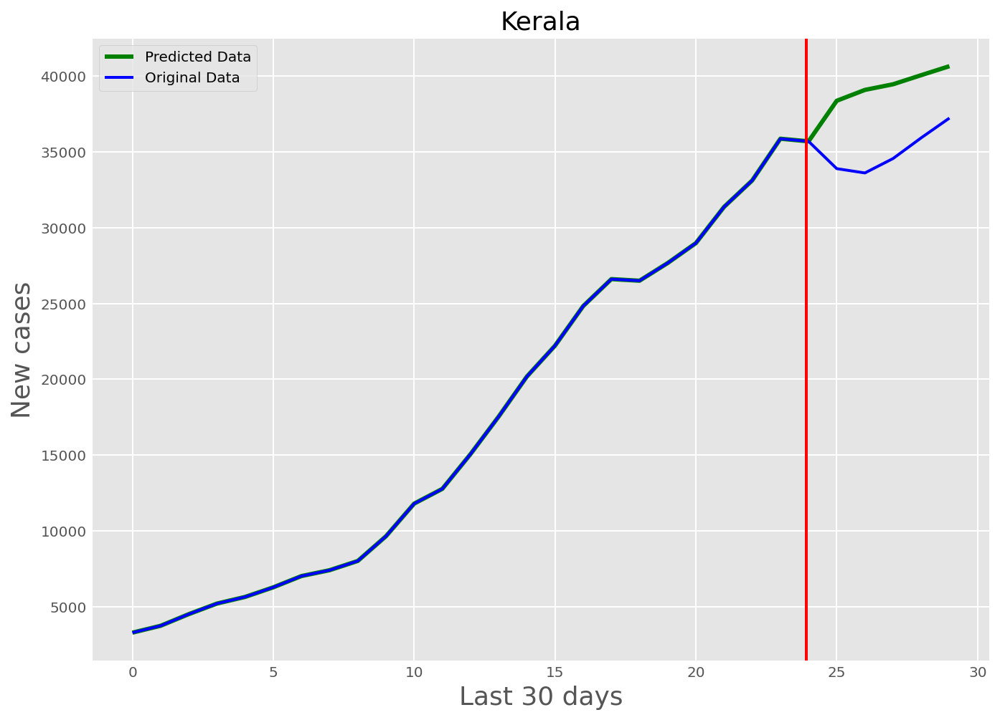

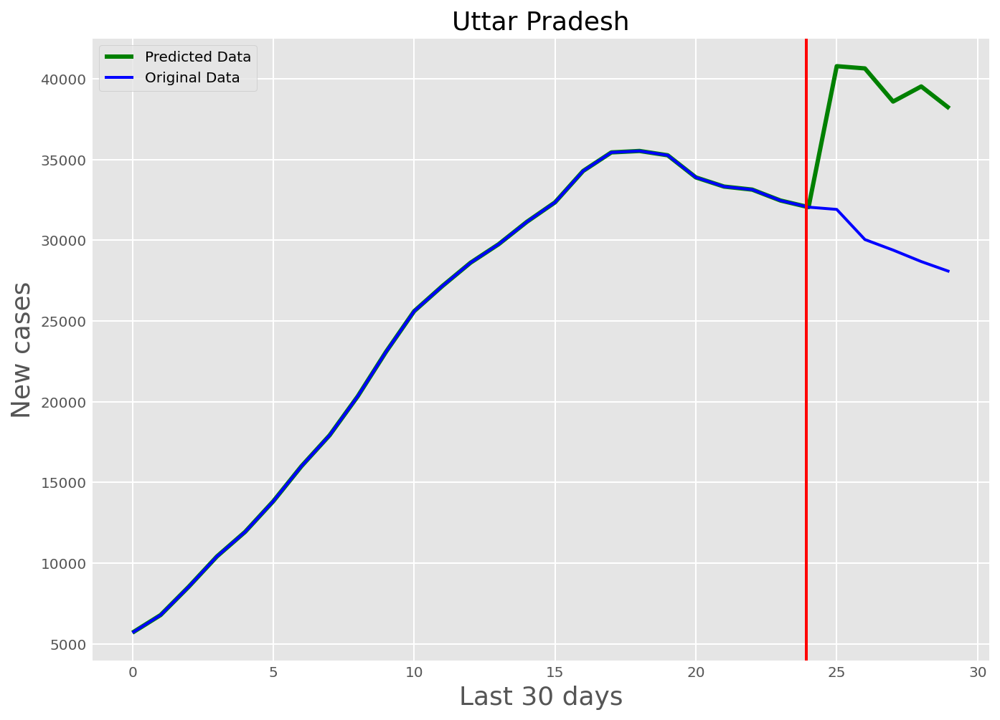

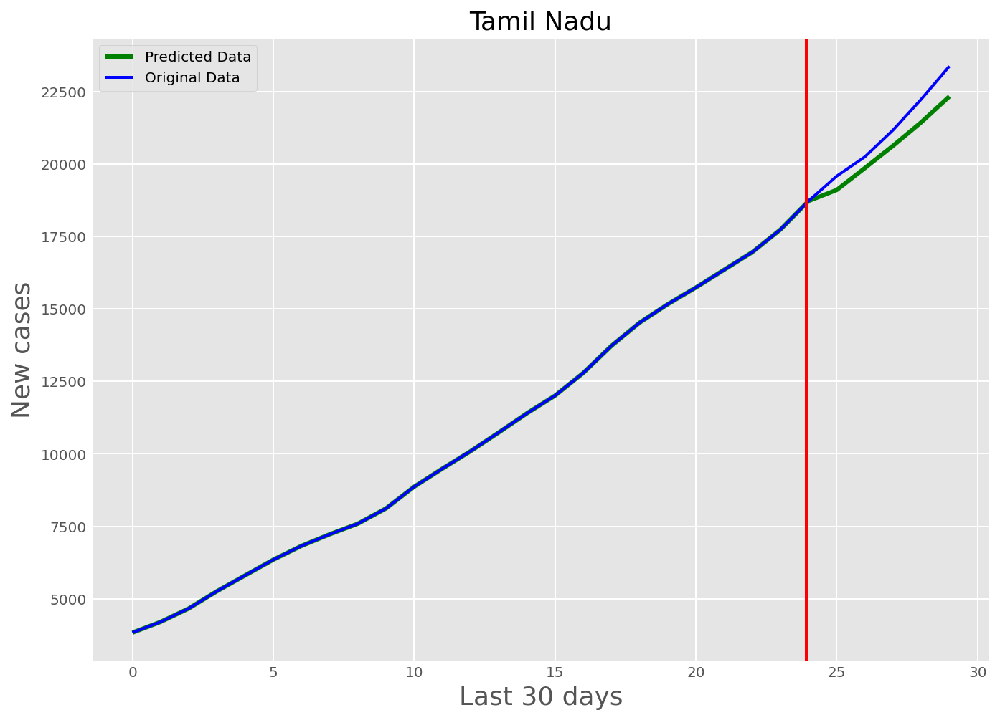

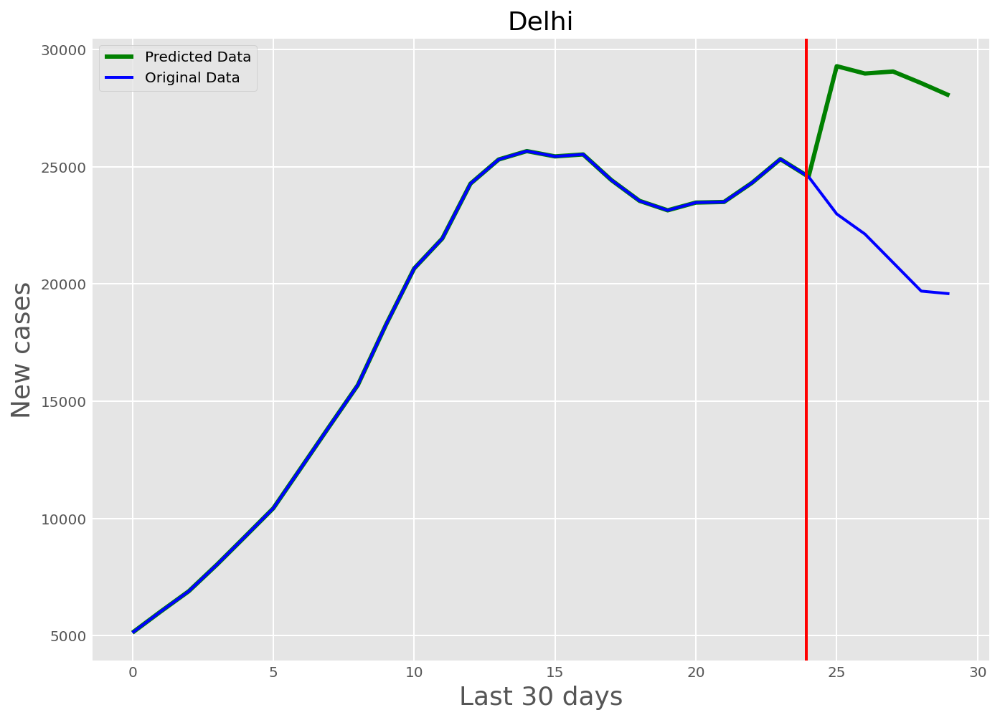

In [107]:
import warnings
warnings.filterwarnings("ignore")

mae_prophet={}
mse_prophet={}
start=time.time()
for state in states:
    data=pd.DataFrame(s_dates[state][:-2], columns=['time'])
    data['y']=state_ma[state]
    data=data.set_index(data['time'])
    data=data.drop(columns='time')
    tt_ratio = 0.95 # Train to Test ratio
    mae,mse=prophet_train(data[-90:], tt_ratio,state)
    mae_prophet[state]=mae
    mse_prophet[state]=mse

end=time.time()
time_prophet=(end-start)/60

In [108]:
mae_mean_prophet=round(np.average(list(mae_prophet.values())),4)
mse_mean_prophet=round(np.average(list(mse_prophet.values())),4)

In [109]:
print('Mean absolute error(MAE) for all 6 states(Average):',mae_mean_prophet)
print('Mean square error(MSE) for all 6 states(Average):',mse_mean_prophet)

Mean absolute error(MAE) for all 6 states(Average): 0.1229
Mean square error(MSE) for all 6 states(Average): 0.0354


### Obervations:

- Fbprophet is developed by facebook and works on data that has a pattern or seasonality 
- Since our data doesn't have good seasonality, the results produced are not adequate 

### 3.3 Holt-Winters

In [110]:
import datetime

In [111]:
dates_timestamp={}
for state in states:
    dates_temp=list()
    for date in s_dates[state]:
        new=datetime.datetime.strptime(date, "%Y-%m-%d")
        new=pd.Timestamp(new)
        dates_temp.append(new)
    dates_timestamp[state]=dates_temp

In [112]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
scaler=MinMaxScaler()
def holt_fit(data, state):
    
    maxx=max(data['y']) #max for graph plotting 
    data['y']=scaler.fit_transform(np.array(data['y']).reshape(-1,1))
    train_data = data.iloc[:-10] #train, test split
    test_data = data.iloc[-10:]
    
    #fitting with smoothing parameters
    fit = Holt(train_data['y'], initialization_method="estimated").fit(smoothing_level=0.8, smoothing_trend=0.4, optimized=False)
    pred = fit.forecast(10).rename("test")
    
    mae= mean_absolute_error(test_data['y'], pred)
    mse=mean_squared_error(test_data['y'], pred)

    plt.figure(figsize=(8,6))

    plt.title(state, fontsize=18)
    plt.xlabel('Last 30 days', fontsize=18)
    plt.ylabel('New cases', fontsize=18)
    
    plt.plot(train_data['ds'][-90:],np.multiply(train_data['y'],maxx)[-90:],label='TRAIN')
    plt.plot(test_data['ds'][-90:],np.multiply(test_data['y'],maxx)[-90:],label='TEST')
    plt.plot(test_data['ds'][-90:],np.multiply(pred,maxx)[-90:],label='PREDICTION')
    plt.legend(['TRAIN','TEST', 'PREDICTION'], prop={'size': 10})
    

    
    return mae,mse    

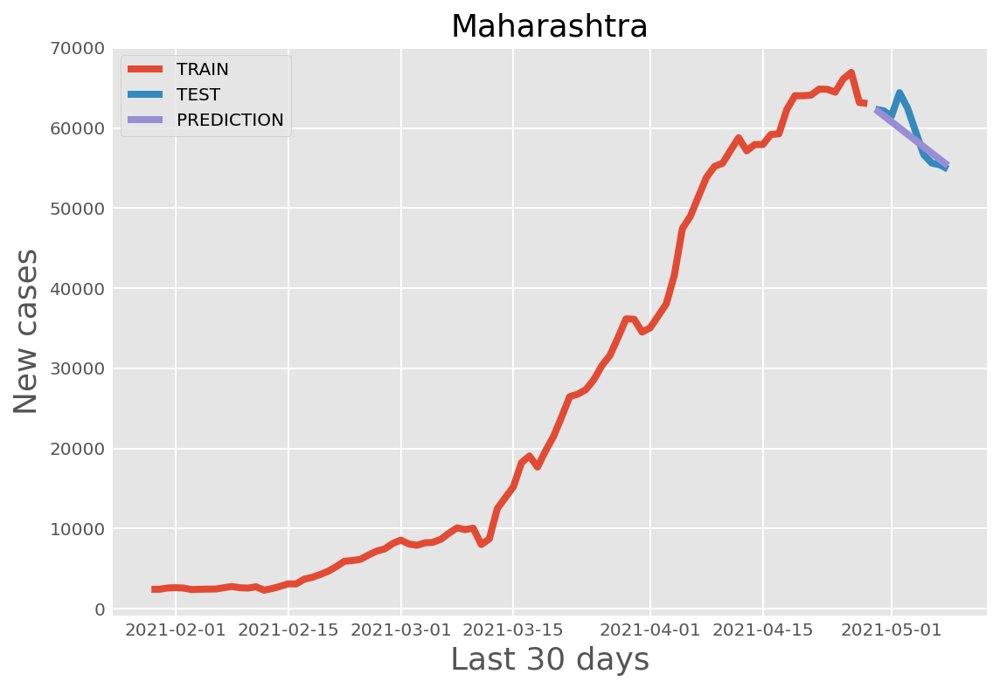

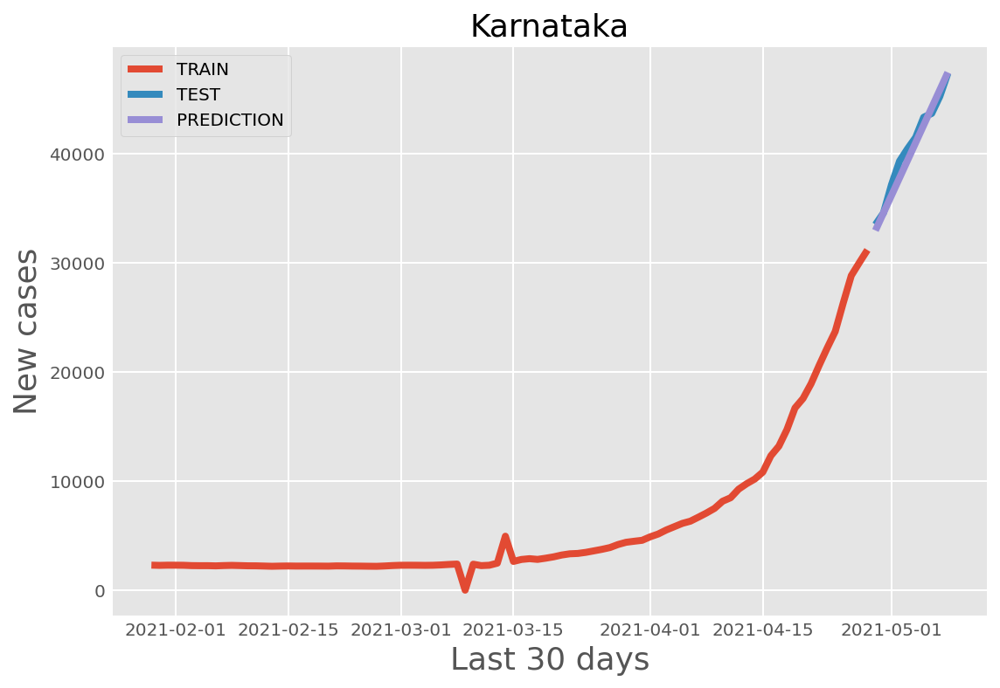

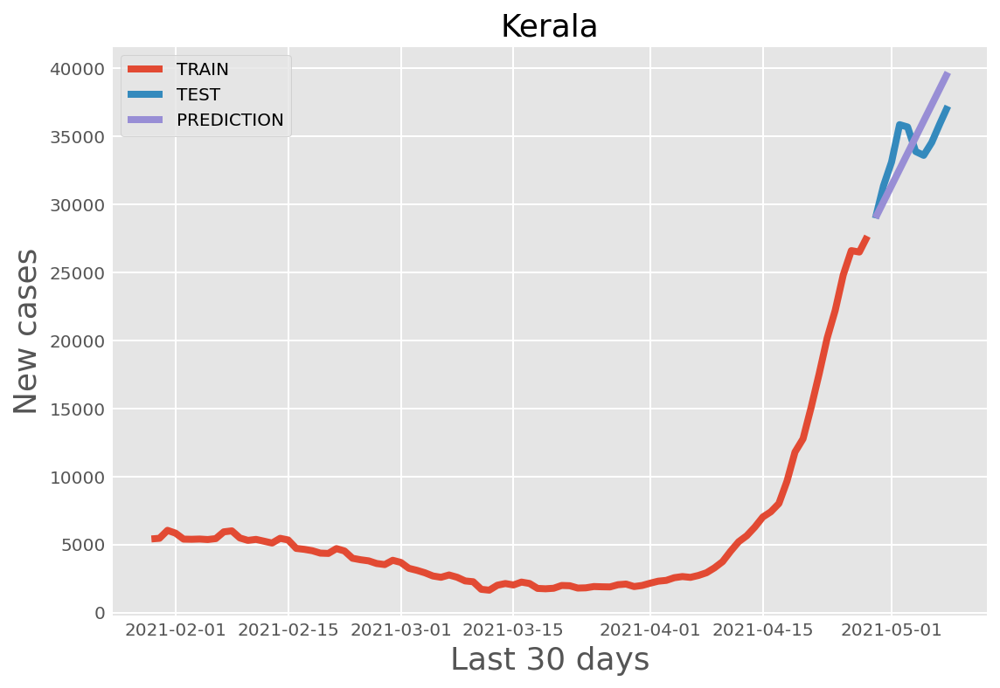

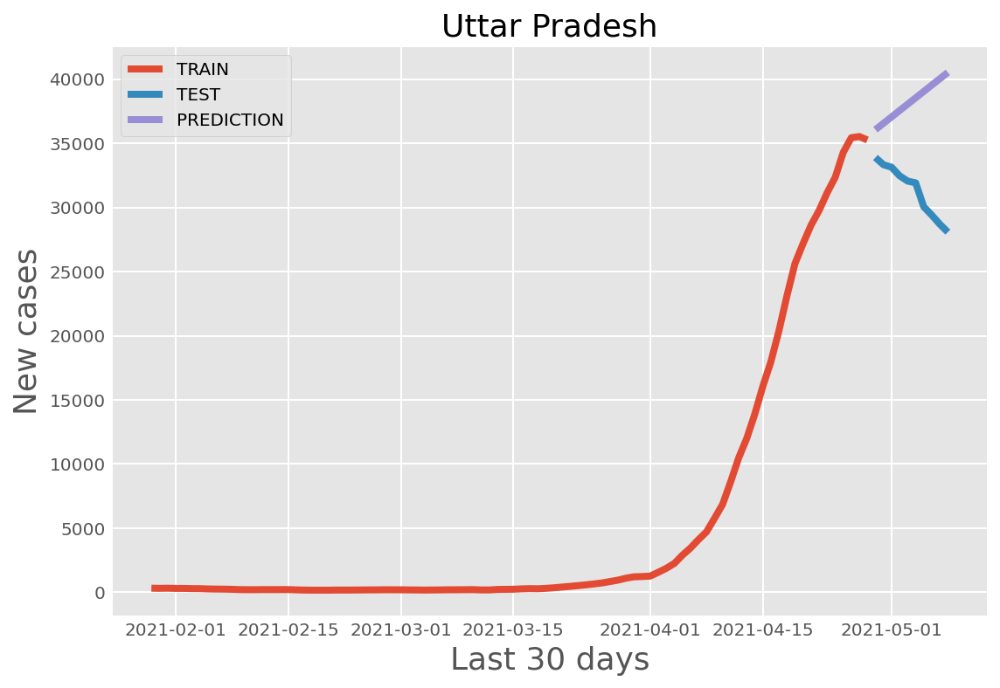

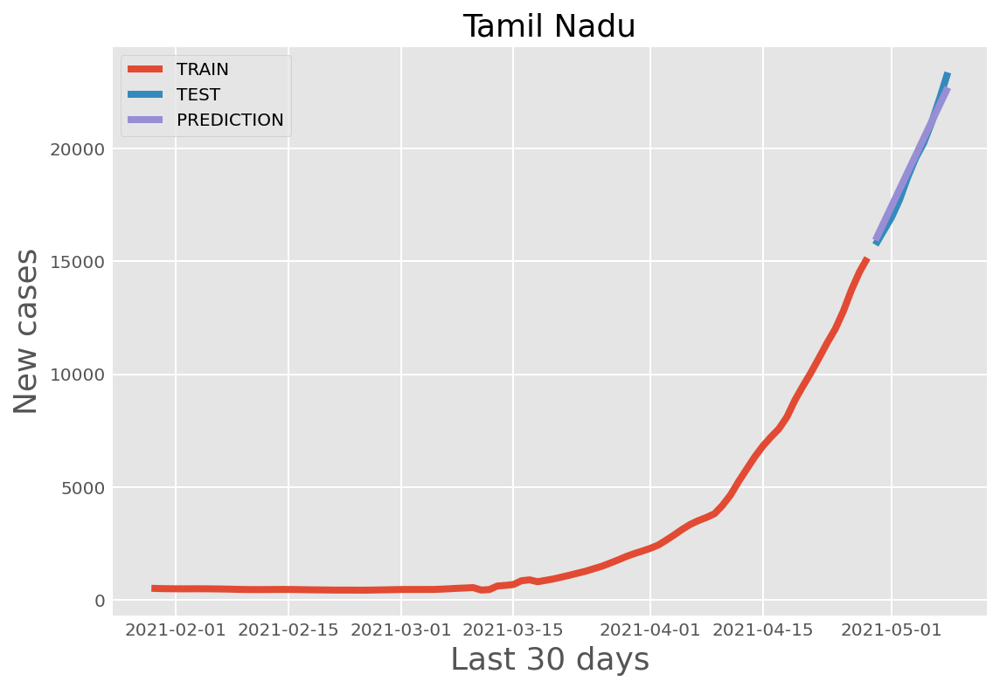

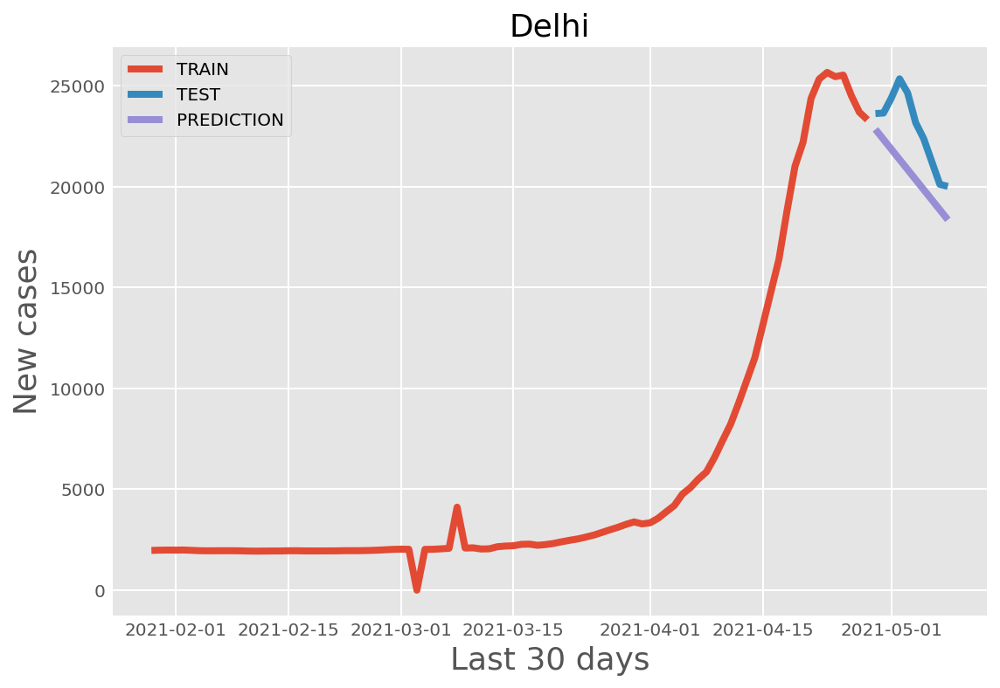

In [113]:
mae_holt={}
mse_holt={}

start=time.time()
for state in states:
    data = pd.DataFrame(columns = ['ds,''y'])
    data['ds'] = dates_timestamp[state][2:]
    data['y'] = state_ma[state]
    mae,mse=holt_fit(data, state)
    mae_holt[state]=mae
    mse_holt[state]=mse

end=time.time()
time_holt=(end-start)/60

In [114]:
mae_mean_holt=round(np.average(list(mae_holt.values())),4)
mse_mean_holt=round(np.average(list(mse_holt.values())),4)

In [115]:
print('Mean absolute error(MAE) for all 6 states(Average):',mae_mean_holt)
print('Mean square error(MSE) for all 6 states(Average):',mse_mean_holt)

Mean absolute error(MAE) for all 6 states(Average): 0.064
Mean square error(MSE) for all 6 states(Average): 0.0103


### Observations

- Holt-Winters Exponential Smoothing is used for forecasting time series data that exhibits both a trend and a seasonal variation.
- This method is stacked over 4 techinques, Holt Winters ES, Holt ES, Exponential Smoothing, Weighted Averaging 
- Holt-winters is not able to give good predictions if the data doesn't have some seasonality 

### 4. MODEL COMPARISION

In [116]:
df_comp=pd.DataFrame({'Metrics':['Mean Squared Error','Mean absolute error', 'Time(mins)']})
df_comp['Arima']=[mae_mean_arima, mse_mean_arima, time_arima]
df_comp['Prophet']=[mae_mean_prophet, mse_mean_prophet, time_prophet]
df_comp['Holt-Winters']=[mae_mean_holt, mse_mean_holt, time_holt]

df_comp.set_index('Metrics', drop=True, inplace=True)
df_comp.head()

,Arima,Prophet,Holt-Winters
Metrics,,,
Mean Squared Error,0.018800,0.122900,0.064000
Mean absolute error,0.000700,0.035400,0.010300
Time(mins),0.280392,1.590035,0.004247


### Observations:

- Even though arima took more time than holt-winters, the results produced by arima outstand the other models.
- We need to aggregate data of each day and 0.27 minutes computation time is nothing compared to that.  
- Arima model gave us a Mean absolute error of 0.019 and Mean squared error of 0.0007

## 5. Forcasting using ARIMA(Best model)

In [117]:
import datetime

In [118]:
def forcast_arima(data, state):
    
    arima = ARIMA(data['y'], order=(6, 2, 0)) #order generated on google colab and fit here 
    arima = arima.fit(trend='c', full_output=True, disp=True)
    
    #forcasting for next 7 days
    forecast = arima.forecast(steps= 7)
    pred = list(forecast[0])

    start_date = data['ds'].max()
    prediction_dates = []
    
    #forcasting for next 7 days
    for i in range(7):
        date = start_date + datetime.timedelta(days=1)
        prediction_dates.append(date)
        start_date = date
        
    plt.figure(figsize= (10,8))
    plt.title(state, fontsize=18)
    plt.xlabel("Dates",fontsize = 16)
    plt.ylabel('Total cases',fontsize = 16)
    plt.xticks(rotation=90)
    #plt.title("Predicted Values for the next 7 days" , fontsize = 16)

    plt.plot_date(y= pred[-30:],x= prediction_dates[-30:],linestyle ='dashed',color = '#ff9999',label = 'Predicted');
    plt.plot_date(y=data['y'][-30:],x=data['ds'][-30:],linestyle = '-',color = 'blue',label = 'Actual');
    plt.legend();

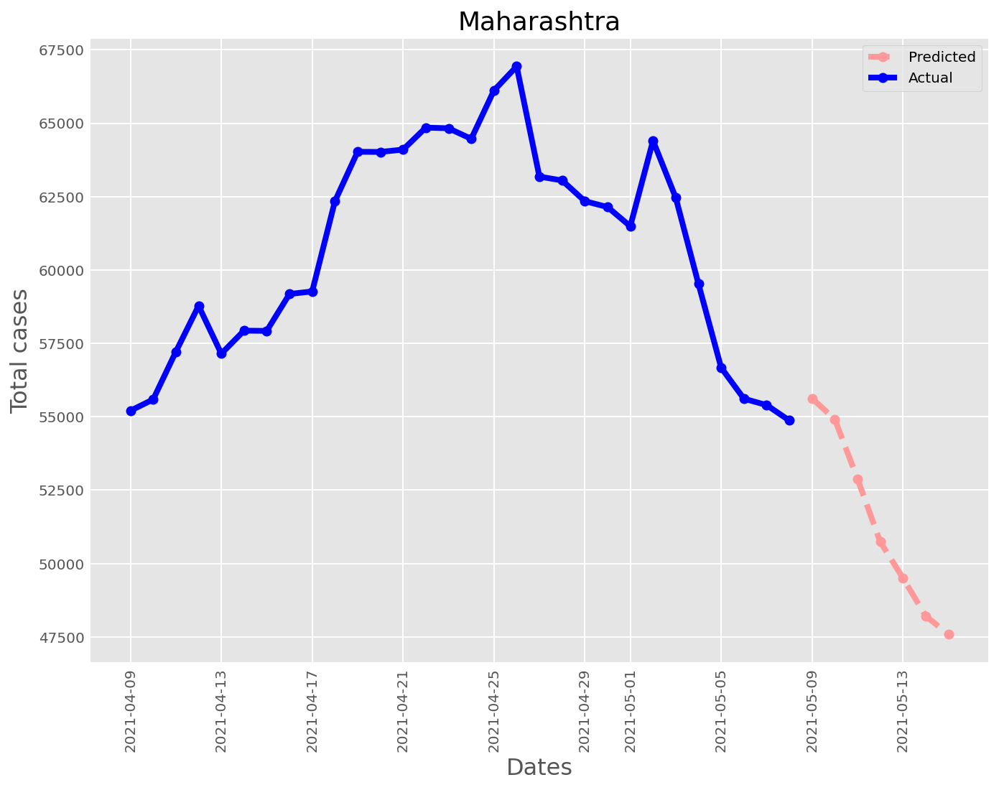

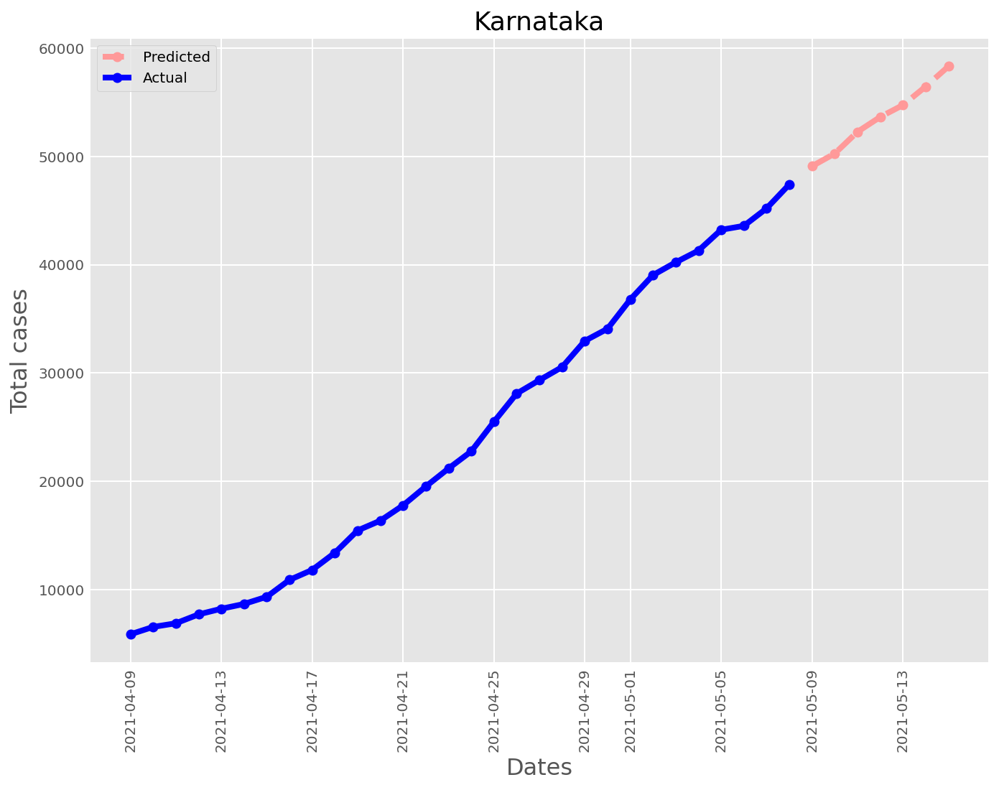

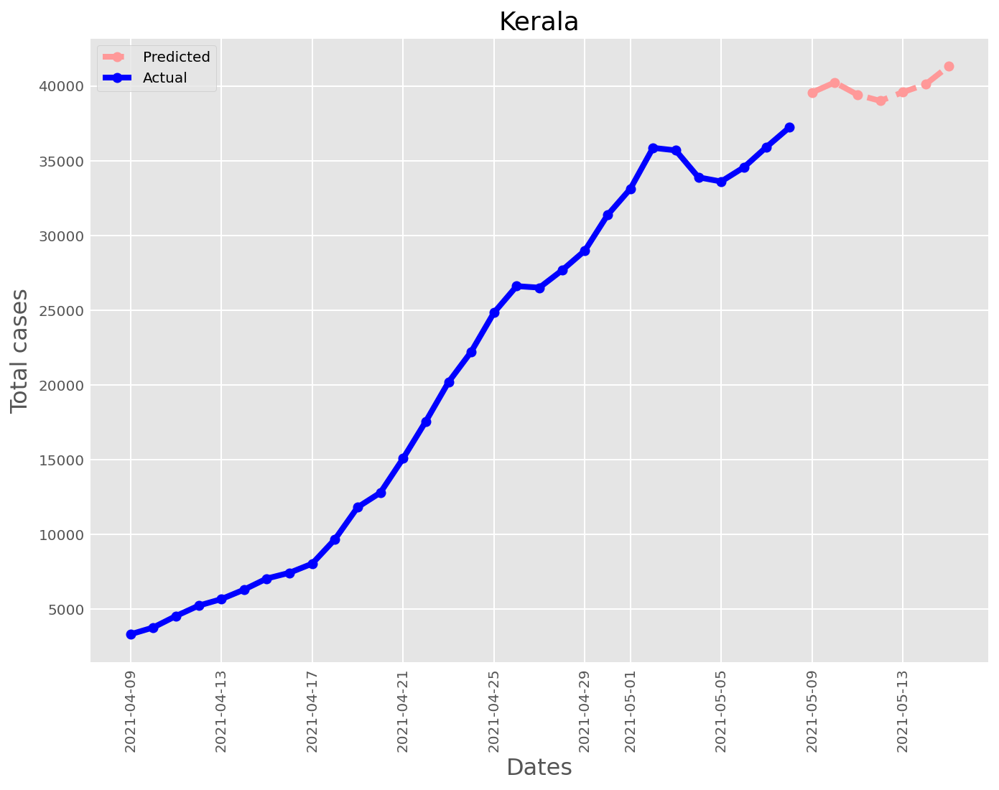

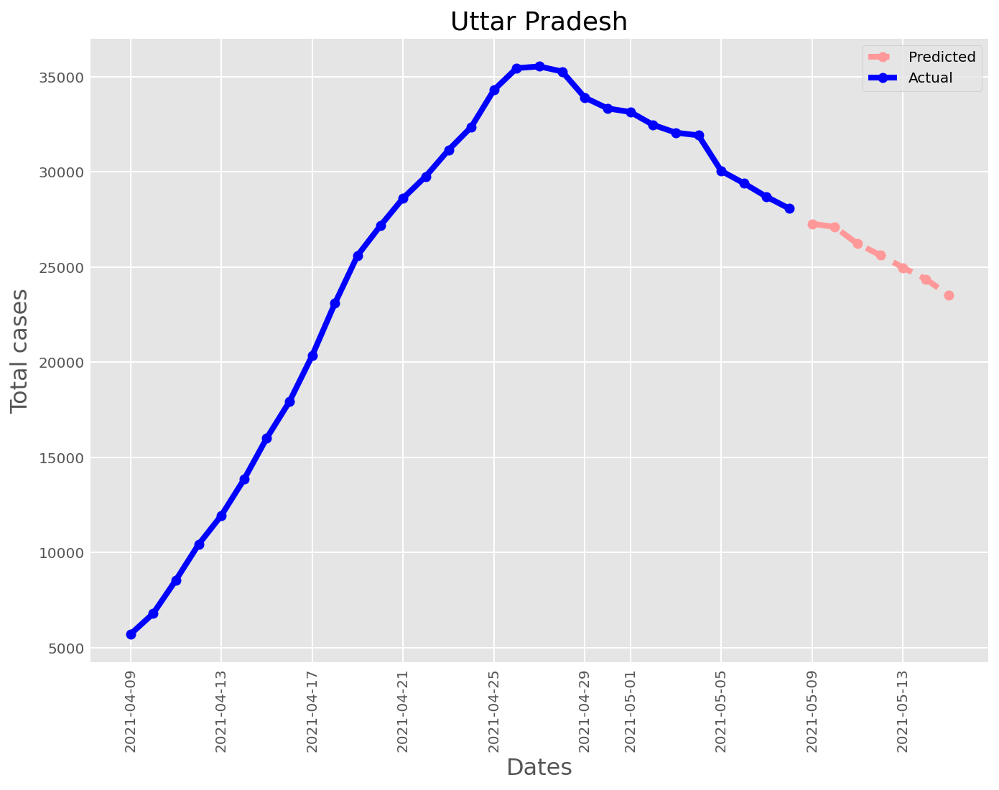

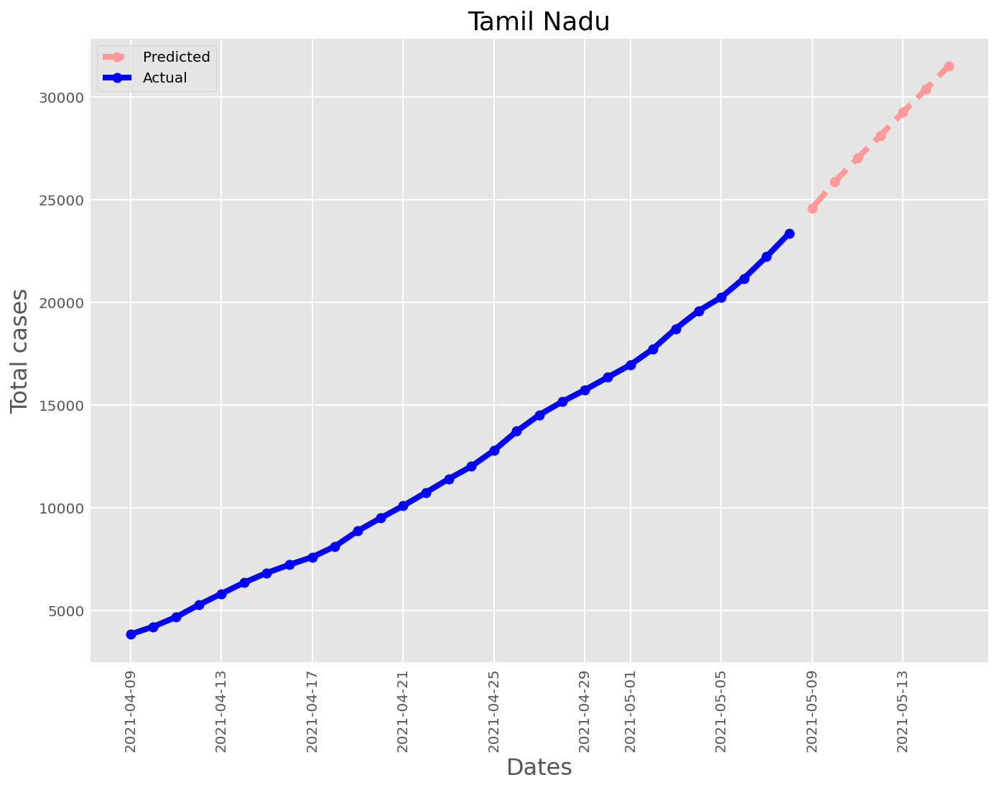

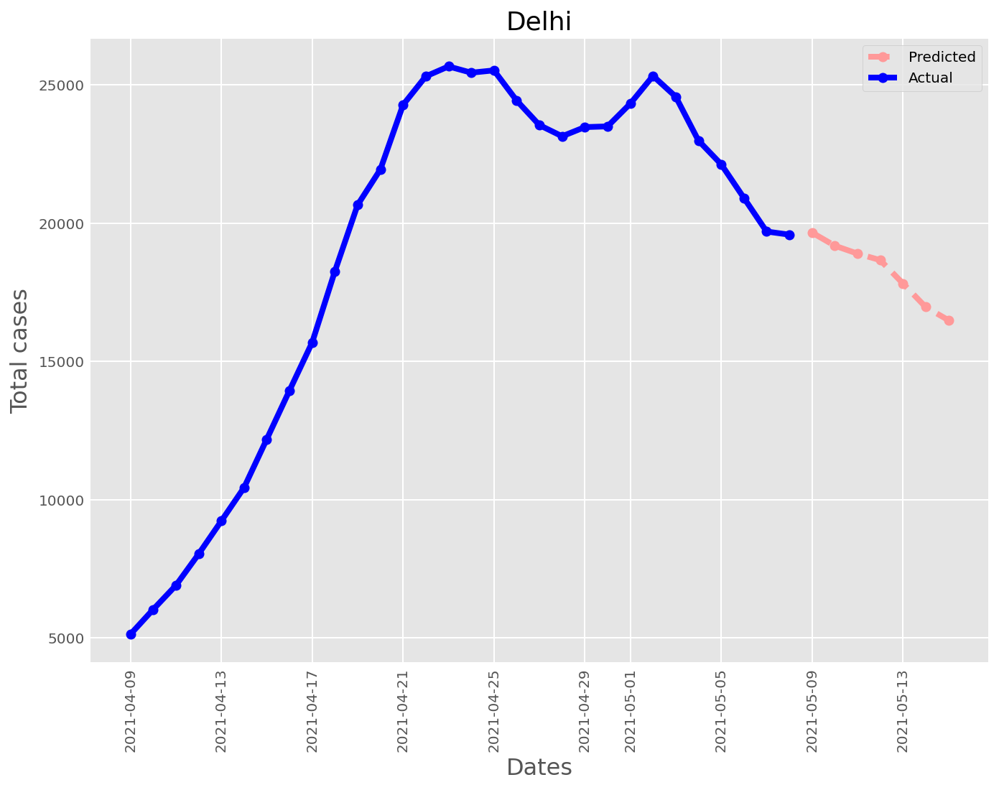

In [119]:
for state in states:
    data = pd.DataFrame(columns = ['ds,''y'])
    data['ds'] = dates_timestamp[state][2:]
    data['y'] = state_ma[state]
    forcast_arima(data, state) 

### Observations:

- Here, We have forcasted the data for the next 7 days.
- The figure shows only last 30 days but the model is trained on the whole dataset. 
- It is visible that for some states the casses have decreased whereas for some they are still rising.
- We had the data till 8th of May but the date when we completed the project was 12th May 2021, Matching the results to the actual new casses on 12th, we notice that Maharashtra, Tamil Nadu and kerala gave us the correct predictions whereas in other states the prediction wasn't that accuracte. 
- Even though the number of casses wasn't predicted correctly for some states, the direction of new casses was very accurate.  


### 6. Conclusion:

1. We tried to analyse covid situations in word and found out that India currently experiencing high number of cases. This acted as a turnaroud in our project which made us focus on India.  
2. Data Visualization gave information about ups and downs of of daily casses in India and we understood that movinf average was necessary to smoothen the data 
2. Data-pre processing was required to get the states with most casses and to generate daily new casses from total confirmed casses. 
3. Using ARIMA, Fbprophet and Holt-winters modelling techniques, we got the best model as ARIMA. 
4. We then performed forcasting for the next 7 days using ARIMA. 
